# Importing libraries

In [1]:
#Importing the Libraries
import numpy as np
import pandas as pd
import datetime
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MaxAbsScaler
from sklearn.decomposition import PCA
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt, numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import AgglomerativeClustering
from matplotlib.colors import ListedColormap
import matplotlib as mpl
from sklearn import metrics
import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter("ignore")
np.random.seed(42)

In [2]:
from google.colab import drive
drive.mount('/gdrive', force_remount = True)

Mounted at /gdrive


# Loading the dataset

In [3]:
#Loading the dataset
data = pd.read_csv("/gdrive/My Drive/DASA/final_dataset_eur_without_outliers.csv")
data = data.drop(columns = ["Unnamed: 0"])
print("Number of datapoints:", len(data))

Number of datapoints: 30632


In [4]:
original_data = data.copy()

# Data Visualization
Focus on Rainfall and Average Temperature that are the features important for clustering

In [5]:
data = data[["Avg_Temp", "Rainfall", "Crop"]]
data

,Avg_Temp,Rainfall,Crop
0,28.236667,1189.48,Arecanut
1,28.294583,887.11,Arecanut
2,28.545833,788.69,Arecanut
3,28.487500,805.96,Arecanut
4,28.289167,1822.37,Arecanut
...,...,...,...
30627,27.330417,815.89,other oilseeds
30628,27.190833,1323.06,other oilseeds
30629,27.066250,2632.85,other oilseeds
30630,27.972083,575.07,other oilseeds


In [6]:
data.describe()

,Avg_Temp,Rainfall
count,30632.000000,30632.000000
mean,26.084822,1178.790085
std,1.233055,681.794662
min,20.491667,34.240000
25%,25.315521,755.730000
50%,26.077500,1013.600000
75%,26.800833,1357.330000
max,29.852083,5505.020000


In [7]:
print("The total number of crops is:\n{}".format(data["Crop"].nunique()))

The total number of crops is:
60


In [8]:
distinct_crops = data["Crop"].value_counts()
print("The distribution for each crop is:\n{}".format(distinct_crops))

The distribution for each crop is:
Sugarcane                    3665
Onion                        2538
Potato                       2374
Dry chillies                 2330
Turmeric                     2120
Sweet potato                 2034
Garlic                       1850
Coriander                    1835
Banana                       1773
Tobacco                      1213
Dry ginger                    831
Arecanut                      830
Tapioca                       769
Guar seed                     539
Cashewnut                     526
Sesamum                       491
Black pepper                  453
Mango                         234
Papaya                        232
Cotton(lint)                  212
Cardamom                      194
Pome Fruit                    189
Citrus Fruit                  184
Tomato                        179
Brinjal                       157
Sunflower                     150
Groundnut                     148
Arhar/Tur                     141
Bhindi       

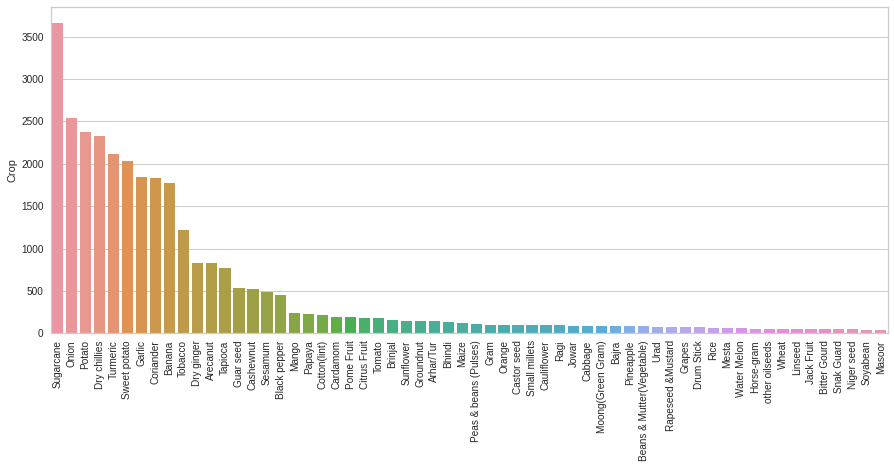

In [9]:
crops = pd.DataFrame(distinct_crops)
plt.figure(figsize = (15, 6))
sns.barplot(y ='Crop', x = crops.index, data = crops)
plt.xticks(rotation = 90)
plt.show()

Reletive Plot of All the Features


<Figure size 576x396 with 0 Axes>

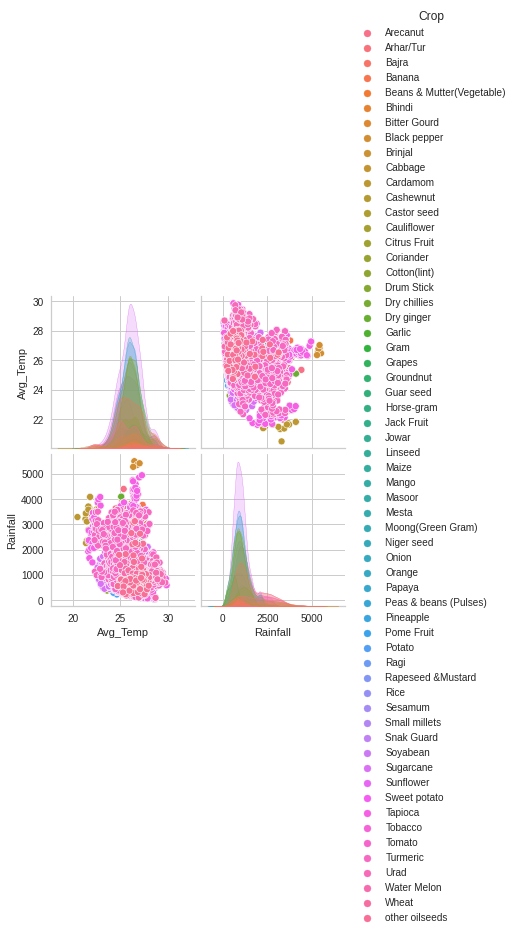

In [10]:
print("Reletive Plot of All the Features")
plt.figure()
sns.pairplot(data, hue = "Crop")
plt.show()

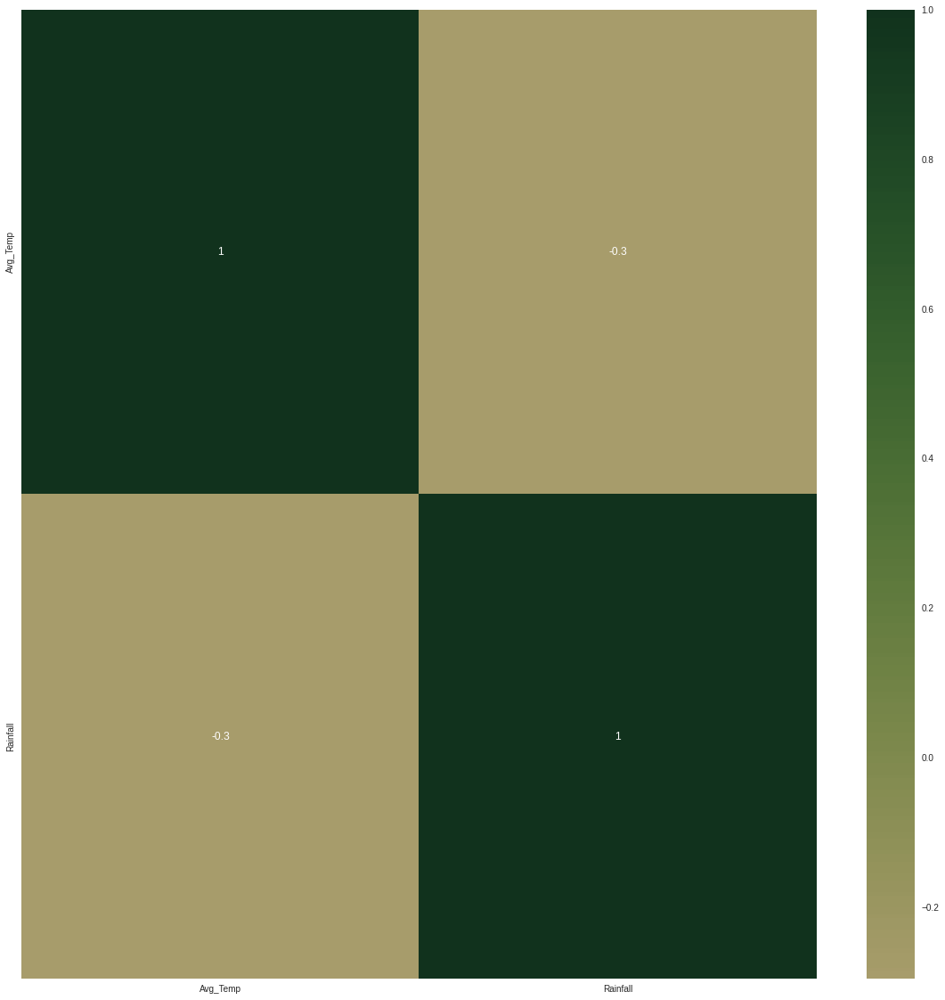

In [11]:
cmap = sns.color_palette("ch: start = -.7 , rot = -.5", as_cmap = True)
corrmat = data.corr()
plt.figure(figsize = (20, 20))  
sns.heatmap(corrmat, annot = True, cmap = cmap, center = 0)

# Data Pre Processing

## Normalization of the data
Using MaxAbsScaler

In [12]:
ds = data.copy()
ds = ds.drop(columns = ["Crop"])
scaler = MaxAbsScaler()
scaler.fit(ds)
scaled_ds = pd.DataFrame(scaler.transform(ds), columns = ds.columns)
scaled_ds

,Avg_Temp,Rainfall
0,0.945886,0.216072
1,0.947826,0.161146
2,0.956243,0.143267
3,0.954289,0.146405
4,0.947645,0.331038
...,...,...
30627,0.915528,0.148208
30628,0.910852,0.240337
30629,0.906679,0.478263
30630,0.937023,0.104463


In [13]:
scaled_ds.describe()

,Avg_Temp,Rainfall
count,30632.000000,30632.000000
mean,0.873802,0.214130
std,0.041305,0.123850
min,0.686440,0.006220
25%,0.848032,0.137280
50%,0.873557,0.184123
75%,0.897788,0.246562
max,1.000000,1.000000


## Reasoning on Dimensionality Reduction 
> "Principal component analysis (PCA) is a technique for reducing the dimensionality of such datasets, increasing interpretability but at the same time minimizing information loss"

PCA is used to reduce the number of features but since in this case they are only 2, it makes no sense to use PCA

# Clustering without PCA

## Elbow method

Elbow Method to determine the number of clusters to be formed without PCA:


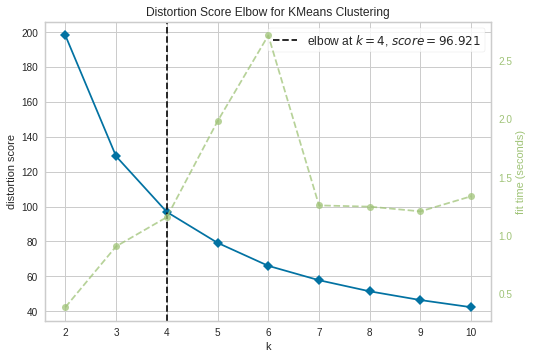

In [14]:
# Quick examination of elbow method to find numbers of clusters to make.
print('Elbow Method to determine the number of clusters to be formed without PCA:')
Elbow_M = KElbowVisualizer(KMeans(), k = 10)
Elbow_M.fit(scaled_ds)
Elbow_M.show()
n_clusters_elbow = Elbow_M.elbow_value_

## Agglomerative Clustering
Agglomerative clustering is a hierarchical clustering method

It involves merging examples until the desired number of clusters is achieved

In [15]:
AC_data = original_data.copy()
AC_ds = scaled_ds.copy()

In [16]:
#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(n_clusters = n_clusters_elbow)
# fit model and predict clusters
label_AC = AC.fit_predict(AC_ds)
#Adding the Clusters feature to the orignal dataframe
AC_data["AC_Clusters"] = label_AC

In [17]:
AC_data

,Crop,N_min,N_max,P_min,P_max,K_min,K_max,Avg_Temp,Rainfall,Productivity,EUR/ha,EUR/kg,Area,Production,Production_kg,AC_Clusters
0,Arecanut,79,100,28,40,79,140,28.236667,1189.48,2750.000000,14119.607590,5.134403,4.0,11.0,11000.0,0
1,Arecanut,79,100,28,40,79,140,28.294583,887.11,1750.000000,8985.204830,5.134403,4.0,7.0,7000.0,0
2,Arecanut,79,100,28,40,79,140,28.545833,788.69,1444.444444,7416.359542,5.134403,18.0,26.0,26000.0,0
3,Arecanut,79,100,28,40,79,140,28.487500,805.96,722.222222,3708.179771,5.134403,18.0,13.0,13000.0,0
4,Arecanut,79,100,28,40,79,140,28.289167,1822.37,444.444444,2281.956782,5.134403,9.0,4.0,4000.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30627,other oilseeds,90,100,10,15,45,50,27.330417,815.89,500.000000,855.733794,1.711468,1600.0,800.0,800000.0,2
30628,other oilseeds,90,100,10,15,45,50,27.190833,1323.06,500.000000,855.733794,1.711468,800.0,400.0,400000.0,0
30629,other oilseeds,90,100,10,15,45,50,27.066250,2632.85,500.000000,855.733794,1.711468,200.0,100.0,100000.0,1
30630,other oilseeds,90,100,10,15,45,50,27.972083,575.07,500.000000,855.733794,1.711468,200.0,100.0,100000.0,2


In [18]:
AC_data.describe()

,N_min,N_max,P_min,P_max,K_min,K_max,Avg_Temp,Rainfall,Productivity,EUR/ha,EUR/kg,Area,Production,Production_kg,AC_Clusters
count,30632.000000,30632.000000,30632.000000,30632.000000,30632.000000,30632.000000,30632.000000,30632.000000,3.063200e+04,3.063200e+04,30632.000000,30632.000000,3.063200e+04,3.063200e+04,30632.000000
mean,69.079068,165.353846,48.279479,77.556934,71.689247,166.556052,26.084822,1178.790085,3.698977e+04,1.004369e+04,1.679121,4532.816793,9.857387e+04,9.857387e+07,0.739488
std,55.556031,122.934628,21.572683,42.334731,68.540825,153.449917,1.233055,681.794662,1.351138e+06,2.467437e+05,2.613743,22580.340784,7.616118e+05,7.616118e+08,0.953886
min,8.000000,10.000000,5.000000,8.000000,0.000000,20.000000,20.491667,34.240000,0.000000e+00,0.000000e+00,0.182557,1.000000,0.000000e+00,0.000000e+00,0.000000
25%,25.000000,60.000000,28.000000,45.000000,30.000000,60.000000,25.315521,755.730000,7.500000e+02,1.140978e+03,0.228196,41.000000,6.400000e+01,6.400000e+04,0.000000
50%,60.000000,100.000000,50.000000,67.000000,60.000000,120.000000,26.077500,1013.600000,2.750000e+03,2.738348e+03,0.855734,256.000000,6.600000e+02,6.600000e+05,0.000000
75%,105.000000,303.000000,60.000000,95.000000,75.000000,220.000000,26.800833,1357.330000,1.300000e+04,6.884147e+03,1.825565,1574.000000,8.755750e+03,8.755750e+06,2.000000
max,200.000000,400.000000,110.000000,250.000000,515.000000,520.000000,29.852083,5505.020000,8.800000e+07,1.606498e+07,17.114676,884618.000000,3.715800e+07,3.715800e+10,3.000000


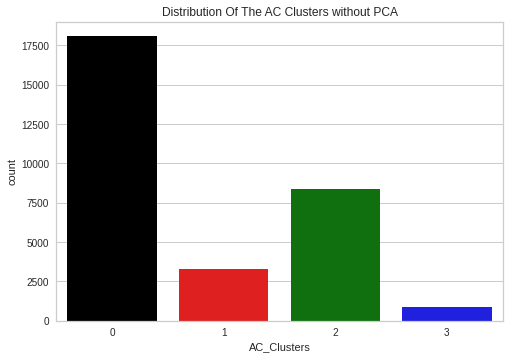

In [22]:
#Plotting countplot of clusters
pallet = ["black", "red", "green", "blue"]
pl = sns.countplot(x = AC_data["AC_Clusters"], palette = pallet)
pl.set_title("Distribution Of The AC Clusters without PCA")
plt.show()

In [23]:
ac_clusters_distribution = AC_data["AC_Clusters"].value_counts()
print("The distribution for each AC cluster without PCA is:\n{}".format(ac_clusters_distribution))

The distribution for each AC cluster without PCA is:
0    18098
2     8384
1     3283
3      867
Name: AC_Clusters, dtype: int64


Reletive Plot of All the Features in the AC Clusters without PCA


<Figure size 576x396 with 0 Axes>

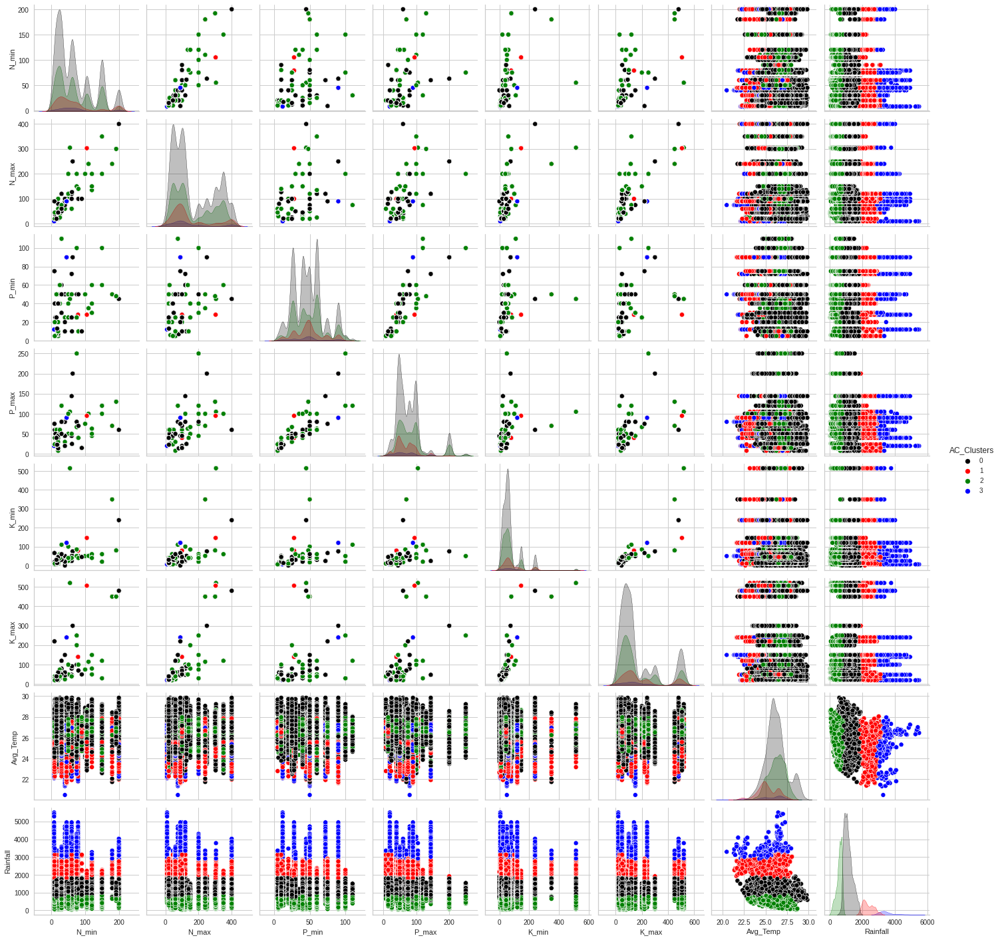

In [24]:
#Plotting features
To_Plot = ["N_min",	"N_max",	"P_min",	"P_max",	"K_min",	"K_max",	"Avg_Temp",	"Rainfall", "AC_Clusters"]
print("Reletive Plot of All the Features in the AC Clusters without PCA")
plt.figure()
sns.pairplot(AC_data[To_Plot], hue = "AC_Clusters", palette = pallet)
plt.show()

In [25]:
AC_cluster0_df = AC_data[AC_data["AC_Clusters"] == 0]
AC_cluster1_df = AC_data[AC_data["AC_Clusters"] == 1]
AC_cluster2_df = AC_data[AC_data["AC_Clusters"] == 2]
AC_cluster3_df = AC_data[AC_data["AC_Clusters"] == 3]
AC_cluster4_df = AC_data[AC_data["AC_Clusters"] == 4]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

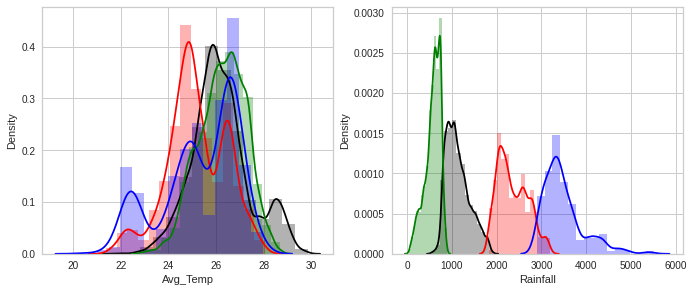

In [26]:
plt.figure(figsize = (24,10))
plt.subplot(2, 4, 1)
sns.distplot(AC_cluster0_df['Avg_Temp'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster1_df['Avg_Temp'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster2_df['Avg_Temp'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster3_df['Avg_Temp'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster4_df['Avg_Temp'],color="purple",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 4, 2)
sns.distplot(AC_cluster0_df['Rainfall'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster1_df['Rainfall'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster2_df['Rainfall'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster3_df['Rainfall'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster4_df['Rainfall'],color="purple",bins=15,hist_kws={'alpha':0.3})

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

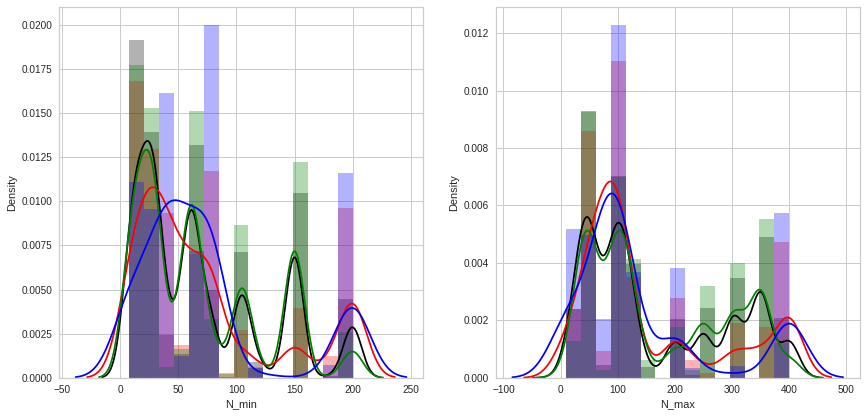

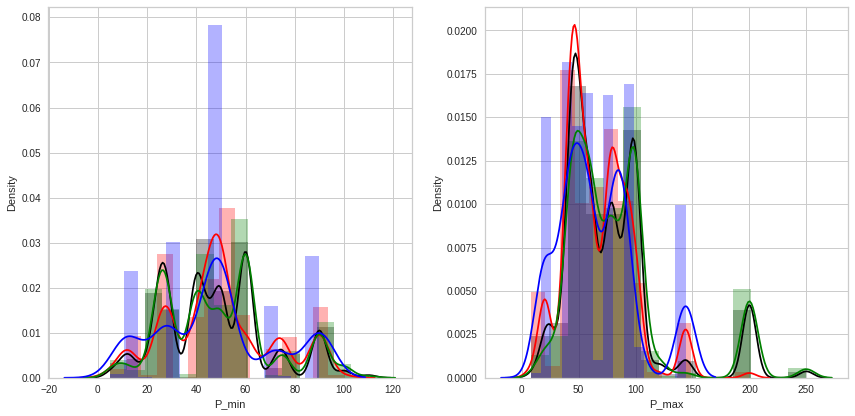

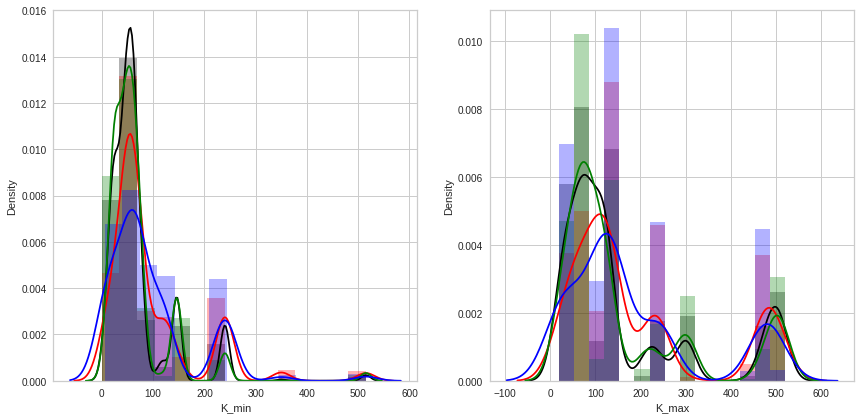

In [27]:
# N_min / N_max
plt.figure(figsize = (30,15))
plt.subplot(2, 4, 1)
sns.distplot(AC_cluster0_df['N_min'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster1_df['N_min'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster2_df['N_min'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster3_df['N_min'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster4_df['N_min'],color="purple",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 4, 2)
sns.distplot(AC_cluster0_df['N_max'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster1_df['N_max'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster2_df['N_max'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster3_df['N_max'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster4_df['N_max'],color="purple",bins=15,hist_kws={'alpha':0.3})

# P_min / P_max
plt.figure(figsize = (30,15))
plt.subplot(2, 4, 1)
sns.distplot(AC_cluster0_df['P_min'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster1_df['P_min'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster2_df['P_min'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster3_df['P_min'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster4_df['P_min'],color="purple",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 4, 2)
sns.distplot(AC_cluster0_df['P_max'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster1_df['P_max'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster2_df['P_max'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster3_df['P_max'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster4_df['P_max'],color="purple",bins=15,hist_kws={'alpha':0.3})

# K_min / K_max
plt.figure(figsize = (30,15))
plt.subplot(2, 4, 1)
sns.distplot(AC_cluster0_df['K_min'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster1_df['K_min'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster2_df['K_min'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster3_df['K_min'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster4_df['K_min'],color="purple",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 4, 2)
sns.distplot(AC_cluster0_df['K_max'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster1_df['K_max'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster2_df['K_max'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster3_df['K_max'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(AC_cluster4_df['K_max'],color="purple",bins=15,hist_kws={'alpha':0.3})

The rainfall is the most important feature for the clustering

In [28]:
count_AC = AC_data.copy()
count_AC = count_AC.drop(columns = ["N_min", "N_max", "P_min", "P_max", "K_min", "K_max", "Avg_Temp", "Rainfall", "Area", "Productivity", "EUR/ha", "EUR/kg", "Production", "Production_kg"])
count_AC["Count"] = 1
count_AC = count_AC.groupby(["Crop", "AC_Clusters"]).sum().reset_index()
count_AC

,Crop,AC_Clusters,Count
0,Arecanut,0,297
1,Arecanut,1,296
2,Arecanut,2,95
3,Arecanut,3,142
4,Arhar/Tur,0,124
...,...,...,...
160,Wheat,0,32
161,Wheat,2,17
162,other oilseeds,0,13
163,other oilseeds,1,8


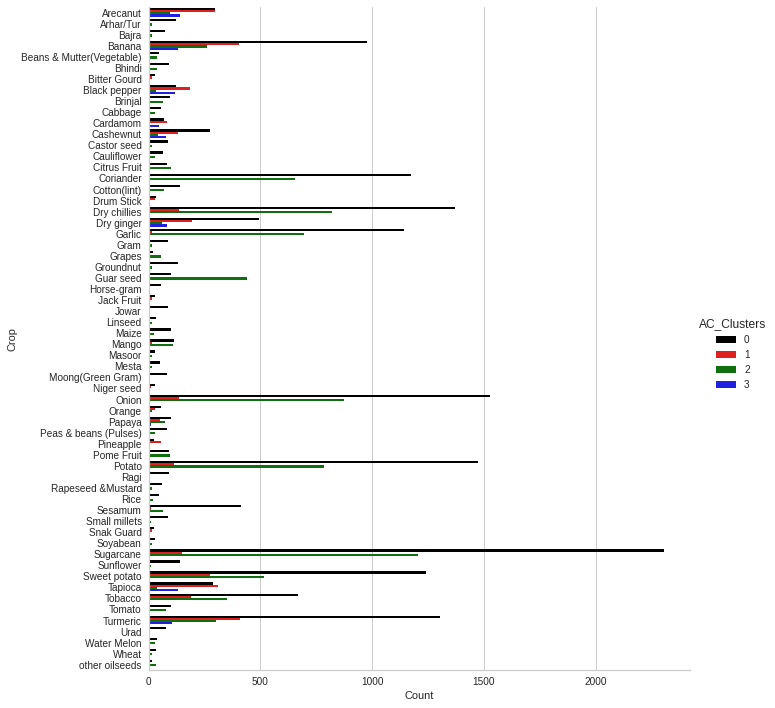

In [29]:
sns.catplot(data = count_AC, x = "Count", y = "Crop", hue = "AC_Clusters", kind = "bar", height = 10, palette = pallet)

## KMeans

In [30]:
KM_data = original_data.copy()
KM_ds = scaled_ds.copy()

In [31]:
KM = KMeans(n_clusters = n_clusters_elbow, init = 'random')
label_KM = KM.fit_predict(scaled_ds)
KM_data["KM_Clusters"] = label_KM

In [32]:
KM_data

,Crop,N_min,N_max,P_min,P_max,K_min,K_max,Avg_Temp,Rainfall,Productivity,EUR/ha,EUR/kg,Area,Production,Production_kg,KM_Clusters
0,Arecanut,79,100,28,40,79,140,28.236667,1189.48,2750.000000,14119.607590,5.134403,4.0,11.0,11000.0,3
1,Arecanut,79,100,28,40,79,140,28.294583,887.11,1750.000000,8985.204830,5.134403,4.0,7.0,7000.0,2
2,Arecanut,79,100,28,40,79,140,28.545833,788.69,1444.444444,7416.359542,5.134403,18.0,26.0,26000.0,2
3,Arecanut,79,100,28,40,79,140,28.487500,805.96,722.222222,3708.179771,5.134403,18.0,13.0,13000.0,2
4,Arecanut,79,100,28,40,79,140,28.289167,1822.37,444.444444,2281.956782,5.134403,9.0,4.0,4000.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30627,other oilseeds,90,100,10,15,45,50,27.330417,815.89,500.000000,855.733794,1.711468,1600.0,800.0,800000.0,2
30628,other oilseeds,90,100,10,15,45,50,27.190833,1323.06,500.000000,855.733794,1.711468,800.0,400.0,400000.0,3
30629,other oilseeds,90,100,10,15,45,50,27.066250,2632.85,500.000000,855.733794,1.711468,200.0,100.0,100000.0,1
30630,other oilseeds,90,100,10,15,45,50,27.972083,575.07,500.000000,855.733794,1.711468,200.0,100.0,100000.0,2


In [33]:
KM_data.describe()

,N_min,N_max,P_min,P_max,K_min,K_max,Avg_Temp,Rainfall,Productivity,EUR/ha,EUR/kg,Area,Production,Production_kg,KM_Clusters
count,30632.000000,30632.000000,30632.000000,30632.000000,30632.000000,30632.000000,30632.000000,30632.000000,3.063200e+04,3.063200e+04,30632.000000,30632.000000,3.063200e+04,3.063200e+04,30632.000000
mean,69.079068,165.353846,48.279479,77.556934,71.689247,166.556052,26.084822,1178.790085,3.698977e+04,1.004369e+04,1.679121,4532.816793,9.857387e+04,9.857387e+07,2.075477
std,55.556031,122.934628,21.572683,42.334731,68.540825,153.449917,1.233055,681.794662,1.351138e+06,2.467437e+05,2.613743,22580.340784,7.616118e+05,7.616118e+08,0.996902
min,8.000000,10.000000,5.000000,8.000000,0.000000,20.000000,20.491667,34.240000,0.000000e+00,0.000000e+00,0.182557,1.000000,0.000000e+00,0.000000e+00,0.000000
25%,25.000000,60.000000,28.000000,45.000000,30.000000,60.000000,25.315521,755.730000,7.500000e+02,1.140978e+03,0.228196,41.000000,6.400000e+01,6.400000e+04,2.000000
50%,60.000000,100.000000,50.000000,67.000000,60.000000,120.000000,26.077500,1013.600000,2.750000e+03,2.738348e+03,0.855734,256.000000,6.600000e+02,6.600000e+05,2.000000
75%,105.000000,303.000000,60.000000,95.000000,75.000000,220.000000,26.800833,1357.330000,1.300000e+04,6.884147e+03,1.825565,1574.000000,8.755750e+03,8.755750e+06,3.000000
max,200.000000,400.000000,110.000000,250.000000,515.000000,520.000000,29.852083,5505.020000,8.800000e+07,1.606498e+07,17.114676,884618.000000,3.715800e+07,3.715800e+10,3.000000


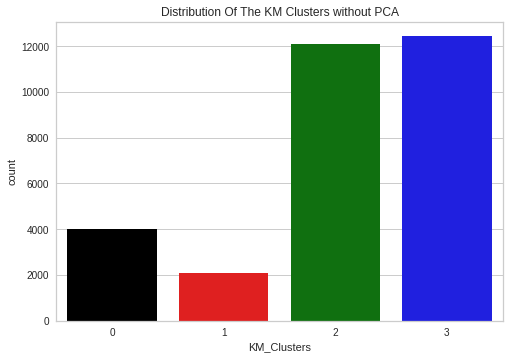

In [34]:
#Plotting countplot of clusters
pallet = ["black", "red", "green", "blue"]
pl = sns.countplot(x = KM_data["KM_Clusters"], palette = pallet)
pl.set_title("Distribution Of The KM Clusters without PCA")
plt.show()

In [35]:
km_clusters_distribution = KM_data["KM_Clusters"].value_counts()
print("The distribution for each KM cluster without PCA is:\n{}".format(km_clusters_distribution))

The distribution for each KM cluster without PCA is:
3    12442
2    12082
0     4022
1     2086
Name: KM_Clusters, dtype: int64


Reletive Plot of All the Features in the KM Clusters without PCA


<Figure size 576x396 with 0 Axes>

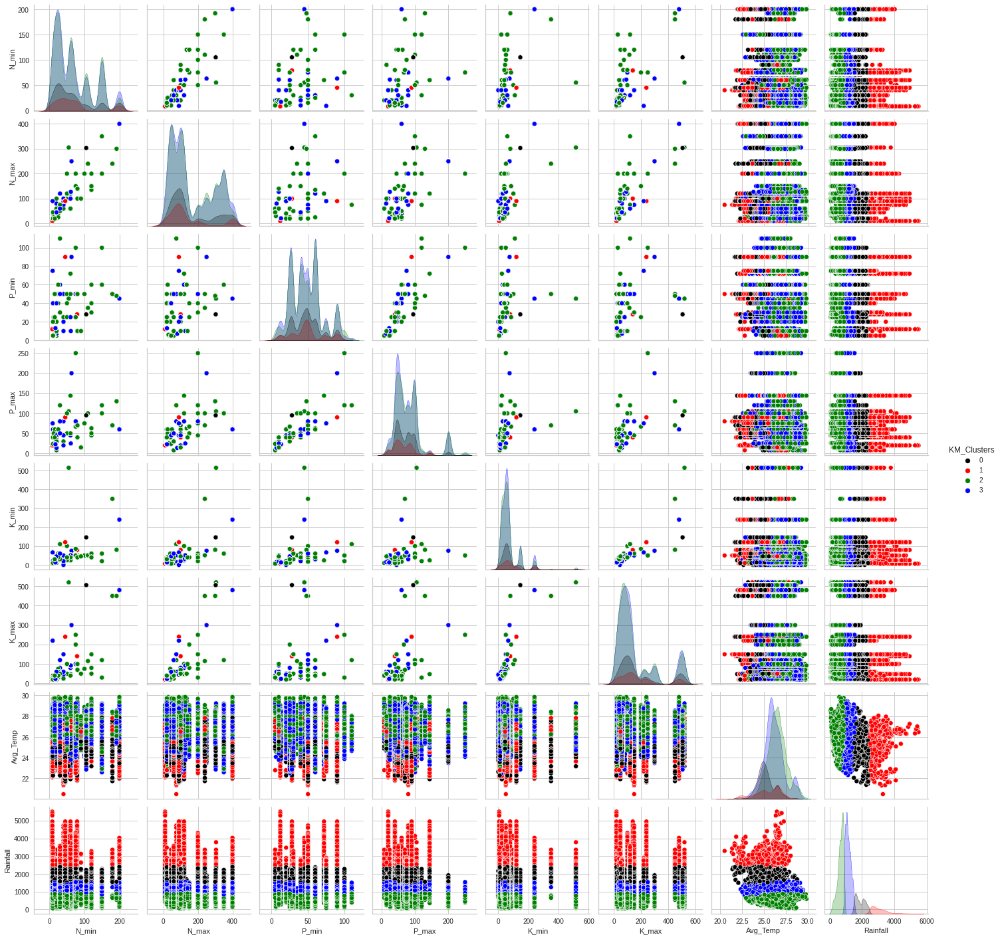

In [36]:
#Plotting features
To_Plot = ["N_min",	"N_max",	"P_min",	"P_max",	"K_min",	"K_max",	"Avg_Temp",	"Rainfall", "KM_Clusters"]
print("Reletive Plot of All the Features in the KM Clusters without PCA")
plt.figure()
sns.pairplot(KM_data[To_Plot], hue = "KM_Clusters", palette = pallet)
plt.show()

In [37]:
KM_cluster0_df = KM_data[KM_data["KM_Clusters"] == 0]
KM_cluster1_df = KM_data[KM_data["KM_Clusters"] == 1]
KM_cluster2_df = KM_data[KM_data["KM_Clusters"] == 2]
KM_cluster3_df = KM_data[KM_data["KM_Clusters"] == 3]
KM_cluster4_df = KM_data[KM_data["KM_Clusters"] == 4]

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

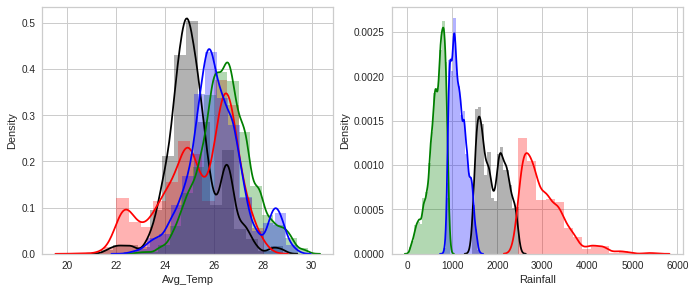

In [38]:
plt.figure(figsize = (24,10))
plt.subplot(2, 4, 1)
sns.distplot(KM_cluster0_df['Avg_Temp'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster1_df['Avg_Temp'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster2_df['Avg_Temp'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster3_df['Avg_Temp'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster4_df['Avg_Temp'],color="purple",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 4, 2)
sns.distplot(KM_cluster0_df['Rainfall'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster1_df['Rainfall'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster2_df['Rainfall'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster3_df['Rainfall'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster4_df['Rainfall'],color="purple",bins=15,hist_kws={'alpha':0.3})

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

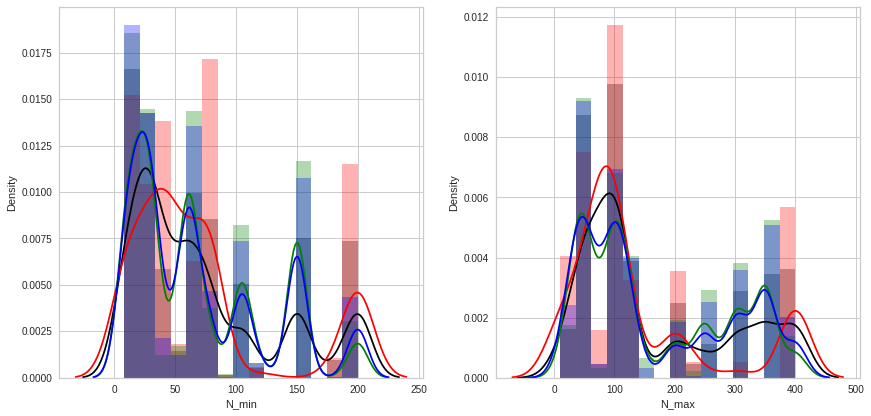

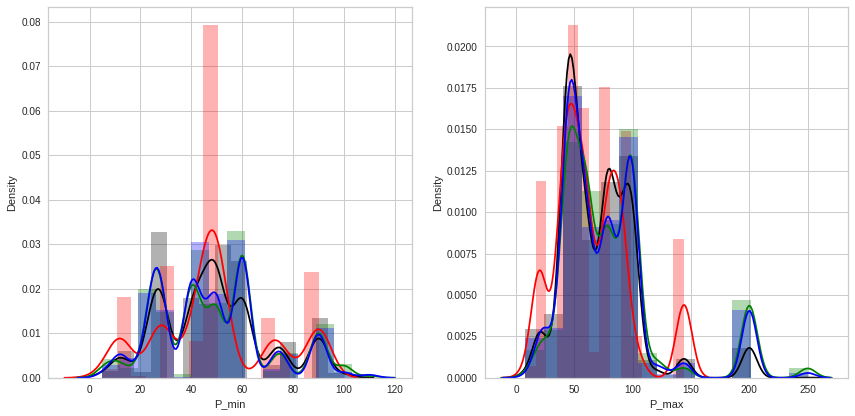

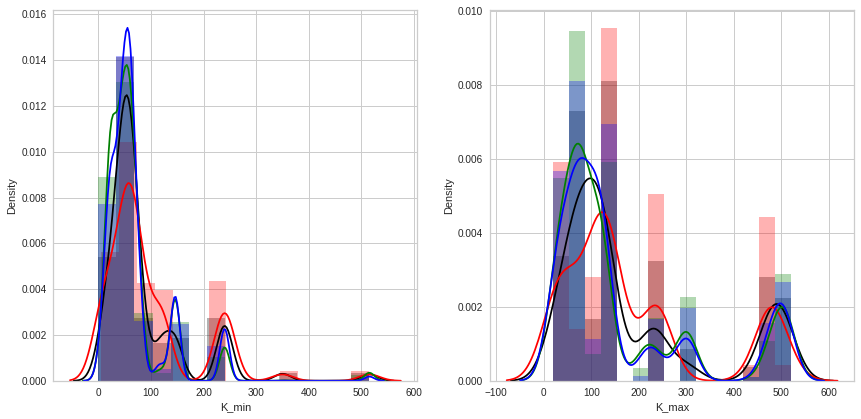

In [39]:
# N_min / N_max
plt.figure(figsize = (30,15))
plt.subplot(2, 4, 1)
sns.distplot(KM_cluster0_df['N_min'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster1_df['N_min'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster2_df['N_min'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster3_df['N_min'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster4_df['N_min'],color="purple",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 4, 2)
sns.distplot(KM_cluster0_df['N_max'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster1_df['N_max'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster2_df['N_max'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster3_df['N_max'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster4_df['N_max'],color="purple",bins=15,hist_kws={'alpha':0.3})

# P_min / P_max
plt.figure(figsize = (30,15))
plt.subplot(2, 4, 1)
sns.distplot(KM_cluster0_df['P_min'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster1_df['P_min'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster2_df['P_min'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster3_df['P_min'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster4_df['P_min'],color="purple",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 4, 2)
sns.distplot(KM_cluster0_df['P_max'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster1_df['P_max'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster2_df['P_max'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster3_df['P_max'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster4_df['P_max'],color="purple",bins=15,hist_kws={'alpha':0.3})

# K_min / K_max
plt.figure(figsize = (30,15))
plt.subplot(2, 4, 1)
sns.distplot(KM_cluster0_df['K_min'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster1_df['K_min'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster2_df['K_min'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster3_df['K_min'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster4_df['K_min'],color="purple",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 4, 2)
sns.distplot(KM_cluster0_df['K_max'],color="black",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster1_df['K_max'],color="red",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster2_df['K_max'],color="green",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster3_df['K_max'],color="blue",bins=15,hist_kws={'alpha':0.3})
sns.distplot(KM_cluster4_df['K_max'],color="purple",bins=15,hist_kws={'alpha':0.3})

The rainfall is the most important feature for the clustering

In [40]:
count_KM = KM_data.copy()
count_KM = count_KM.drop(columns = ["N_min", "N_max", "P_min", "P_max", "K_min", "K_max", "Avg_Temp", "Rainfall", "Area", "Productivity", "EUR/ha", "EUR/kg", "Production", "Production_kg"])
count_KM["Count"] = 1
count_KM = count_KM.groupby(["Crop", "KM_Clusters"]).sum().reset_index()
count_KM

,Crop,KM_Clusters,Count
0,Arecanut,0,234
1,Arecanut,1,282
2,Arecanut,2,132
3,Arecanut,3,182
4,Arhar/Tur,0,1
...,...,...,...
179,Wheat,3,20
180,other oilseeds,0,8
181,other oilseeds,1,4
182,other oilseeds,2,35


Compare to the Aglomerative Clustering, we have more overlapping per crop

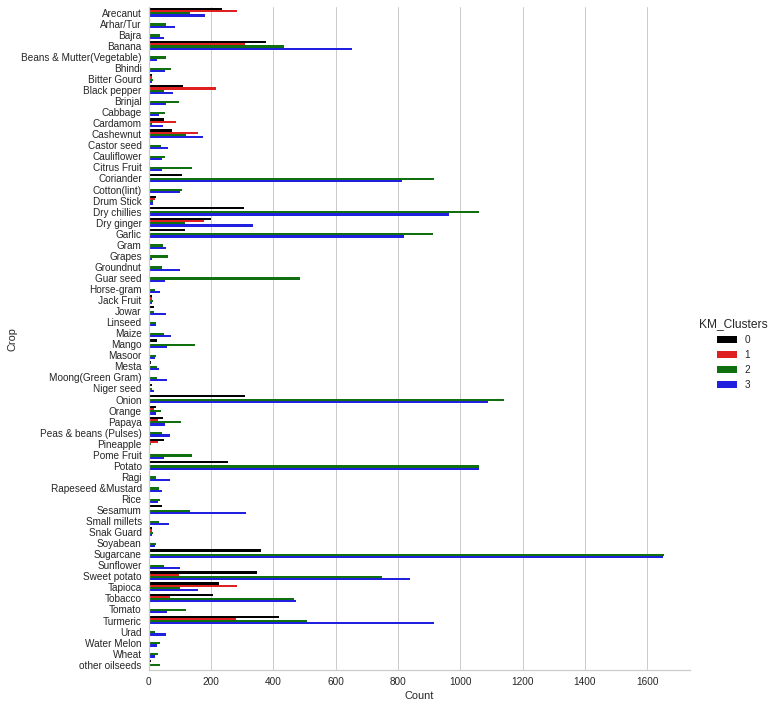

In [41]:
sns.catplot(data = count_KM, x = "Count", y = "Crop", hue = "KM_Clusters", kind = "bar", height = 10, palette = pallet)

# Evaluation of the model
For KMeans we have a better distribution of the data so we take that model as the best one to evaluate

In [57]:
count_original = original_data.copy()
count_original = count_original.drop(columns = ["N_min", "N_max", "P_min", "P_max", "K_min", "K_max", "Avg_Temp", "Rainfall", "Area", "Productivity", "EUR/ha", "EUR/kg", "Production", "Production_kg"])
count_original["Total_Count"] = 1
count_original = count_original.groupby(["Crop"]).sum().reset_index()
count_original

,Crop,Total_Count
0,Arecanut,830
1,Arhar/Tur,141
2,Bajra,86
3,Banana,1773
4,Beans & Mutter(Vegetable),84
5,Bhindi,128
6,Bitter Gourd,47
7,Black pepper,453
8,Brinjal,157
9,Cabbage,87


## Cluster 0

In [84]:
KM_cluster0_df.describe()

,N_min,N_max,P_min,P_max,K_min,K_max,Avg_Temp,Rainfall,Productivity,EUR/ha,EUR/kg,Area,Production,Production_kg,KM_Clusters
count,4022.000000,4022.000000,4022.00000,4022.000000,4022.000000,4022.000000,4022.000000,4022.000000,4.022000e+03,4.022000e+03,4022.000000,4022.000000,4.022000e+03,4.022000e+03,4022.0
mean,71.989309,164.246395,48.53456,71.127797,85.972402,183.058180,25.157663,1900.002121,2.781742e+04,8.078040e+03,1.609909,2407.721226,8.221546e+04,8.221546e+07,0.0
std,58.981791,124.365632,20.36731,33.689973,82.077826,156.640354,1.055867,281.801368,1.175589e+06,2.146258e+05,1.860842,10515.967456,8.149560e+05,8.149560e+08,0.0
min,8.000000,10.000000,5.00000,8.000000,0.000000,20.000000,21.390417,1439.840000,0.000000e+00,0.000000e+00,0.182557,1.000000,0.000000e+00,0.000000e+00,0.0
25%,30.000000,60.000000,28.00000,45.000000,45.000000,80.000000,24.550729,1641.880000,7.560080e+02,1.140978e+03,0.399342,84.000000,1.392500e+02,1.392500e+05,0.0
50%,60.000000,100.000000,50.00000,60.000000,60.000000,120.000000,24.996667,1860.100000,2.881084e+03,2.717336e+03,0.855734,357.000000,7.785000e+02,7.785000e+05,0.0
75%,105.000000,303.000000,60.00000,90.000000,79.000000,240.000000,25.696667,2146.520000,9.320474e+03,6.002700e+03,1.825565,1536.500000,5.861750e+03,5.861750e+06,0.0
max,200.000000,400.000000,100.00000,250.000000,515.000000,520.000000,28.811250,2473.710000,7.455000e+07,1.360959e+07,10.268806,201080.000000,1.802747e+07,1.802747e+10,0.0


Reletive Plot of All the Features in the KM Clusters without PCA


<Figure size 576x396 with 0 Axes>

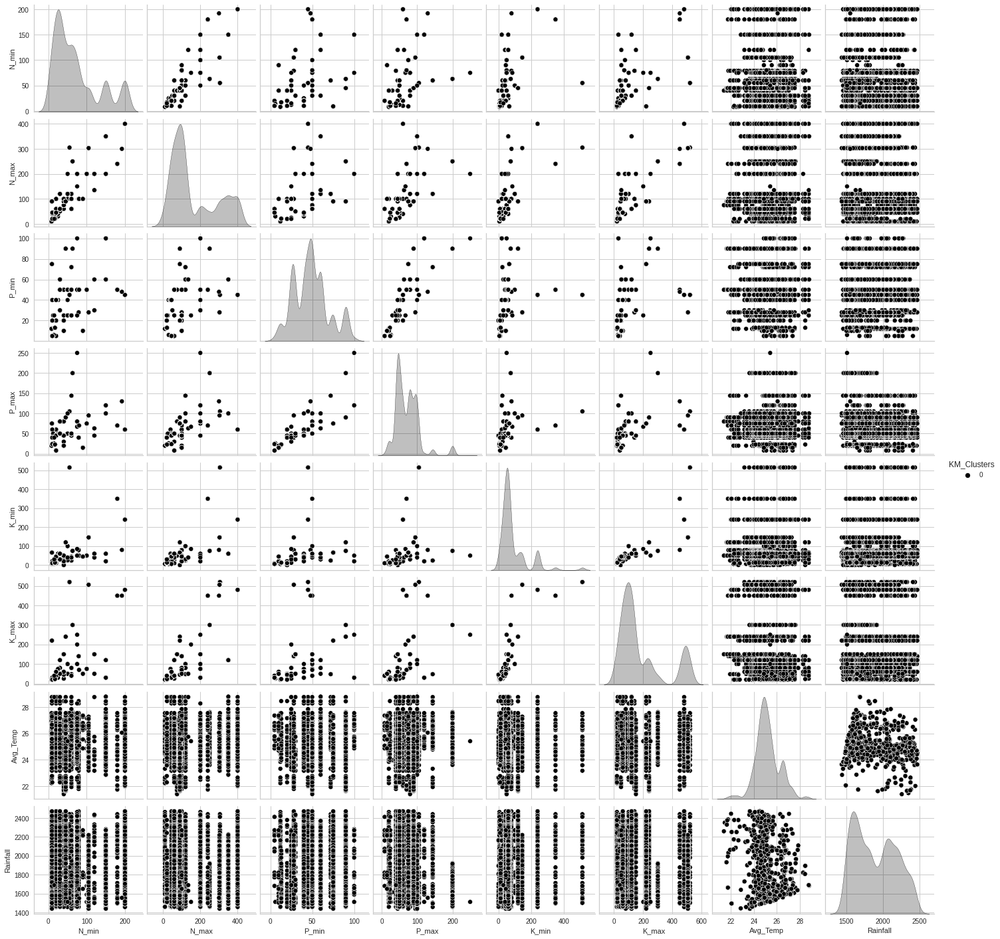

In [85]:
#Plotting features
palette_blk = ["black"]
To_Plot = ["N_min",	"N_max",	"P_min",	"P_max",	"K_min",	"K_max",	"Avg_Temp",	"Rainfall", "KM_Clusters"]
print("Reletive Plot of All the Features in the KM Clusters without PCA")
plt.figure()
sns.pairplot(KM_cluster0_df[To_Plot], hue = "KM_Clusters", palette = palette_blk)
plt.show()

### Analysis on Environmental Conditions
Average annual temperature and total annual rainfall 

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


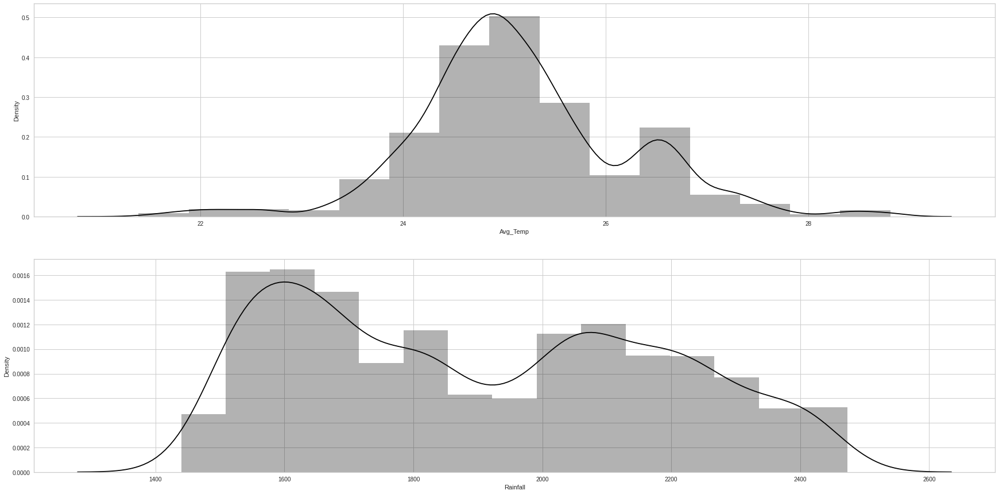

In [86]:
plt.figure(figsize = (30,15))
plt.subplot(2, 1, 1)
sns.distplot(KM_cluster0_df['Avg_Temp'],color="black",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 1, 2)
sns.distplot(KM_cluster0_df['Rainfall'],color="black",bins=15,hist_kws={'alpha':0.3})

In [87]:
cluster_0_temp_median = KM_cluster0_df["Avg_Temp"].median()
print("The median of the Average Temperature for cluster 0 is:\n{}".format(cluster_0_temp_median))

The median of the Average Temperature for cluster 0 is:
24.996666666666663


In [88]:
cluster_0_rain_median = KM_cluster0_df["Rainfall"].median()
print("The median of the Rainfall for cluster 0 is:\n{}".format(cluster_0_rain_median))

The median of the Rainfall for cluster 0 is:
1860.1


### Analysis on Fertilizer Conditions

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

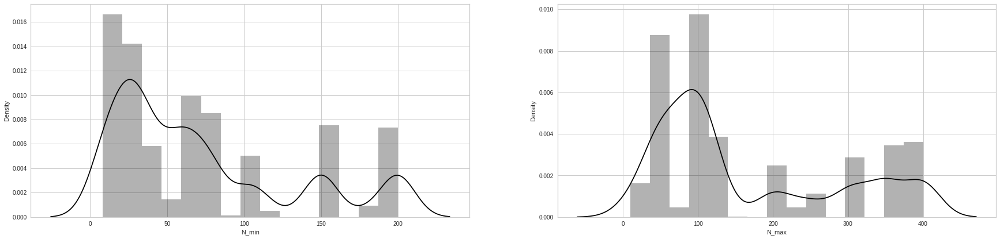

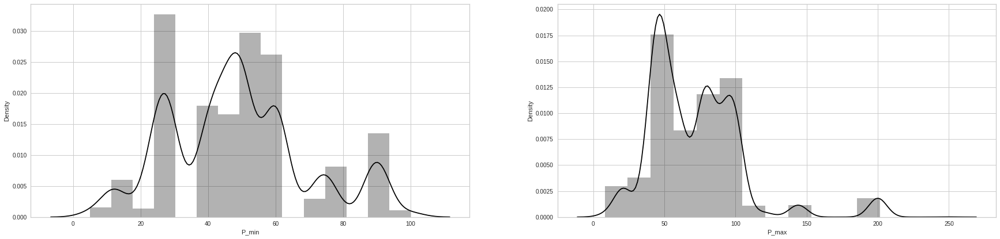

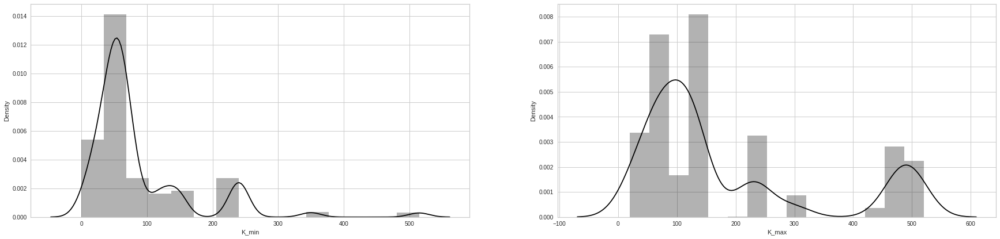

In [89]:
# N_min / N_max
plt.figure(figsize = (30,15))
plt.subplot(2, 2, 1)
sns.distplot(KM_cluster0_df['N_min'],color="black",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 2, 2)
sns.distplot(KM_cluster0_df['N_max'],color="black",bins=15,hist_kws={'alpha':0.3})

# P_min / P_max
plt.figure(figsize = (30,15))
plt.subplot(2, 2, 1)
sns.distplot(KM_cluster0_df['P_min'],color="black",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 2, 2)
sns.distplot(KM_cluster0_df['P_max'],color="black",bins=15,hist_kws={'alpha':0.3})

# K_min / K_max
plt.figure(figsize = (30,15))
plt.subplot(2, 2, 1)
sns.distplot(KM_cluster0_df['K_min'],color="black",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 2, 2)
sns.distplot(KM_cluster0_df['K_max'],color="black",bins=15,hist_kws={'alpha':0.3})

In [90]:
cluster_0_Nmin_median = KM_cluster0_df["N_min"].median()
print("The median of the N_min for cluster 0 is:\n{}".format(cluster_0_Nmin_median))
cluster_0_Nmax_median = KM_cluster0_df["N_max"].median()
print("The median of the N_max for cluster 0 is:\n{}".format(cluster_0_Nmax_median))

The median of the N_min for cluster 0 is:
60.0
The median of the N_max for cluster 0 is:
100.0


In [91]:
cluster_0_Pmin_median = KM_cluster0_df["P_min"].median()
print("The median of the P_min for cluster 0 is:\n{}".format(cluster_0_Pmin_median))
cluster_0_Pmax_median = KM_cluster0_df["P_max"].median()
print("The median of the P_max for cluster 0 is:\n{}".format(cluster_0_Pmax_median))

The median of the P_min for cluster 0 is:
50.0
The median of the P_max for cluster 0 is:
60.0


In [92]:
cluster_0_Kmin_median = KM_cluster0_df["K_min"].median()
print("The median of the K_min for cluster 0 is:\n{}".format(cluster_0_Kmin_median))
cluster_0_Kmax_median = KM_cluster0_df["K_max"].median()
print("The median of the K_max for cluster 0 is:\n{}".format(cluster_0_Kmax_median))

The median of the K_min for cluster 0 is:
60.0
The median of the K_max for cluster 0 is:
120.0


### Presence compare to the total dataset

In [93]:
count_0 = KM_cluster0_df.copy()
count_0 = count_0.drop(columns = ["N_min", "N_max", "P_min", "P_max", "K_min", "K_max", "Avg_Temp", "Rainfall", "Area", "Productivity", "EUR/ha", "EUR/kg", "Production", "Production_kg"])
count_0["Count"] = 1
count_0 = count_0.groupby(["Crop", "KM_Clusters"]).sum().reset_index()
count_0

,Crop,KM_Clusters,Count
0,Arecanut,0,234
1,Arhar/Tur,0,1
2,Bajra,0,1
3,Banana,0,377
4,Bhindi,0,5
5,Bitter Gourd,0,12
6,Black pepper,0,110
7,Brinjal,0,5
8,Cardamom,0,48
9,Cashewnut,0,74


In [94]:
count_0_total = pd.merge(count_0, count_original, on = "Crop")
count_0_total["%in0"] = count_0_total["Count"]*100/count_0_total["Total_Count"]
count_0_total

,Crop,KM_Clusters,Count,Total_Count,%in0
0,Arecanut,0,234,830,28.192771
1,Arhar/Tur,0,1,141,0.709220
2,Bajra,0,1,86,1.162791
3,Banana,0,377,1773,21.263395
4,Bhindi,0,5,128,3.906250
5,Bitter Gourd,0,12,47,25.531915
6,Black pepper,0,110,453,24.282561
7,Brinjal,0,5,157,3.184713
8,Cardamom,0,48,194,24.742268
9,Cashewnut,0,74,526,14.068441


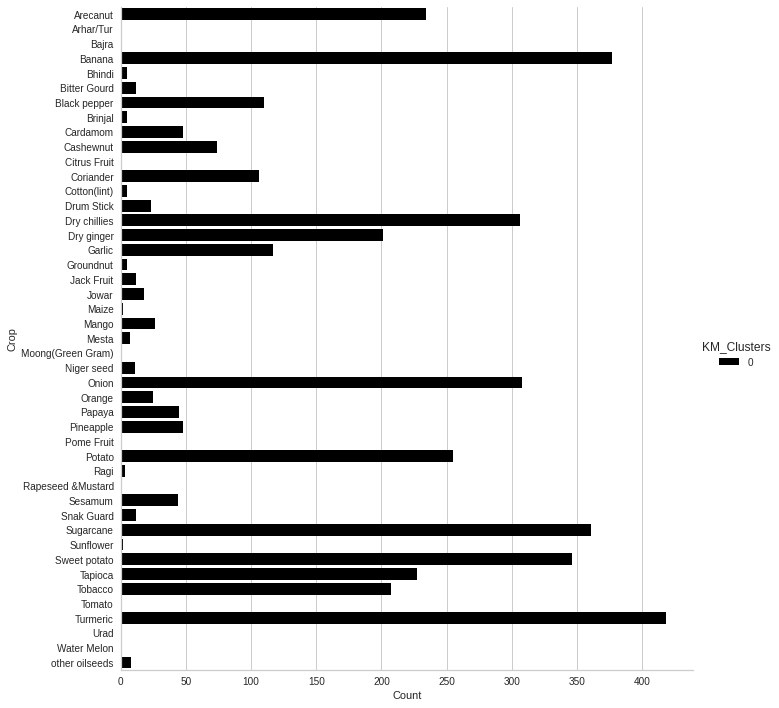

In [95]:
sns.catplot(data = count_0, x = "Count", y = "Crop", hue = "KM_Clusters", kind = "bar", height = 10, palette = palette_blk)

## Cluster 1

In [96]:
KM_cluster1_df.describe()

,N_min,N_max,P_min,P_max,K_min,K_max,Avg_Temp,Rainfall,Productivity,EUR/ha,EUR/kg,Area,Production,Production_kg,KM_Clusters
count,2086.000000,2086.00000,2086.000000,2086.000000,2086.000000,2086.000000,2086.000000,2086.000000,2086.000000,2086.000000,2086.000000,2086.000000,2086.00000,2.086000e+03,2086.0
mean,70.179291,139.21860,48.999041,64.976989,97.175935,184.997124,25.339427,3042.151218,6129.442916,6020.046291,2.980196,3003.850681,15165.31197,1.516531e+07,1.0
std,61.022302,121.85128,22.882035,31.669584,91.981576,150.995262,1.504953,489.666794,9749.476790,6738.470061,2.657443,5394.524938,48883.09207,4.888309e+07,0.0
min,8.000000,10.00000,5.000000,8.000000,6.000000,20.000000,20.491667,2466.000000,0.000000,0.000000,0.353703,1.000000,0.00000,0.000000e+00,1.0
25%,30.000000,60.00000,28.000000,40.000000,50.000000,100.000000,24.336667,2664.800000,587.604279,1970.060150,0.684587,178.500000,292.00000,2.920000e+05,1.0
50%,45.000000,90.00000,50.000000,60.000000,60.000000,140.000000,25.519167,2910.520000,1883.205456,4074.503571,1.825565,883.500000,1163.50000,1.163500e+06,1.0
75%,79.000000,200.00000,50.000000,80.000000,120.000000,240.000000,26.550104,3300.640000,7775.261741,7416.359541,5.134403,2917.692500,9720.75000,9.720750e+06,1.0
max,200.000000,400.00000,90.000000,144.000000,515.000000,520.000000,28.050833,5505.020000,103000.000000,71316.525791,10.268806,49749.000000,650489.00000,6.504890e+08,1.0


Reletive Plot of All the Features in the KM Clusters without PCA


<Figure size 576x396 with 0 Axes>

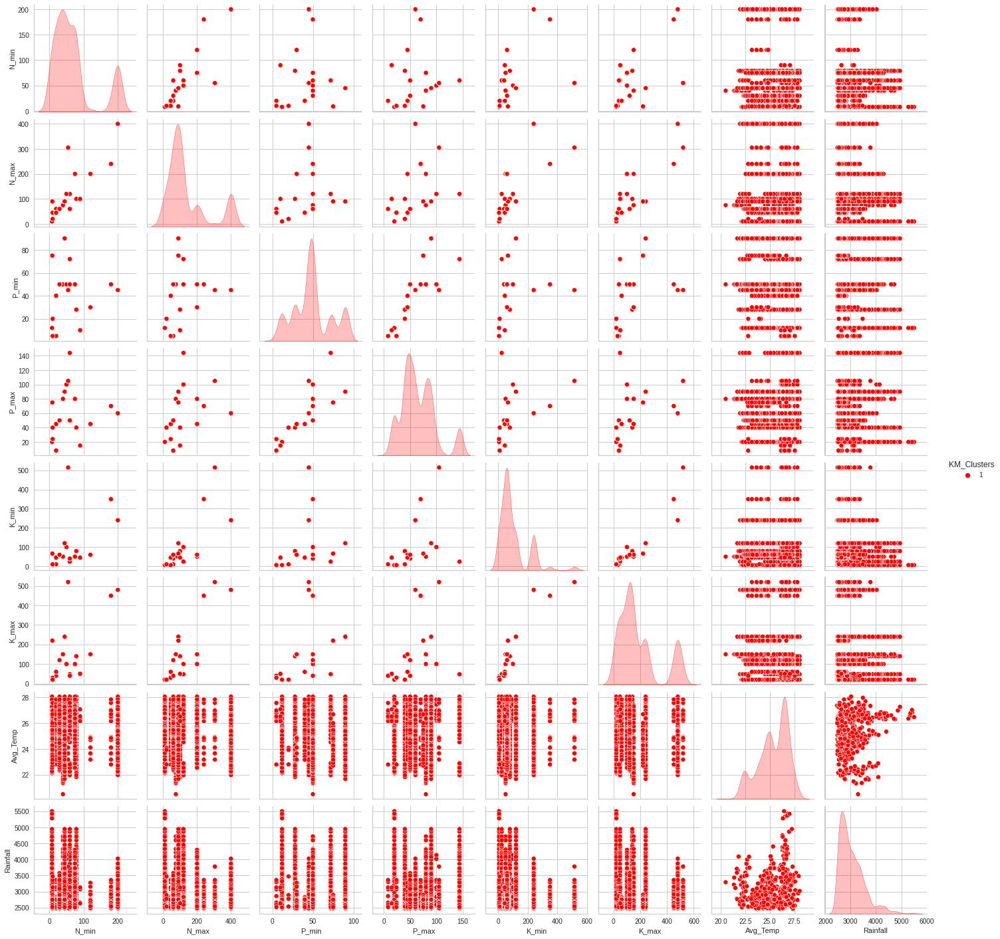

In [97]:
#Plotting features
palette_red = ["red"]
To_Plot = ["N_min",	"N_max",	"P_min",	"P_max",	"K_min",	"K_max",	"Avg_Temp",	"Rainfall", "KM_Clusters"]
print("Reletive Plot of All the Features in the KM Clusters without PCA")
plt.figure()
sns.pairplot(KM_cluster1_df[To_Plot], hue = "KM_Clusters", palette = palette_red)
plt.show()

### Analysis on Environmental Conditions
Average annual temperature and total annual rainfall 

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


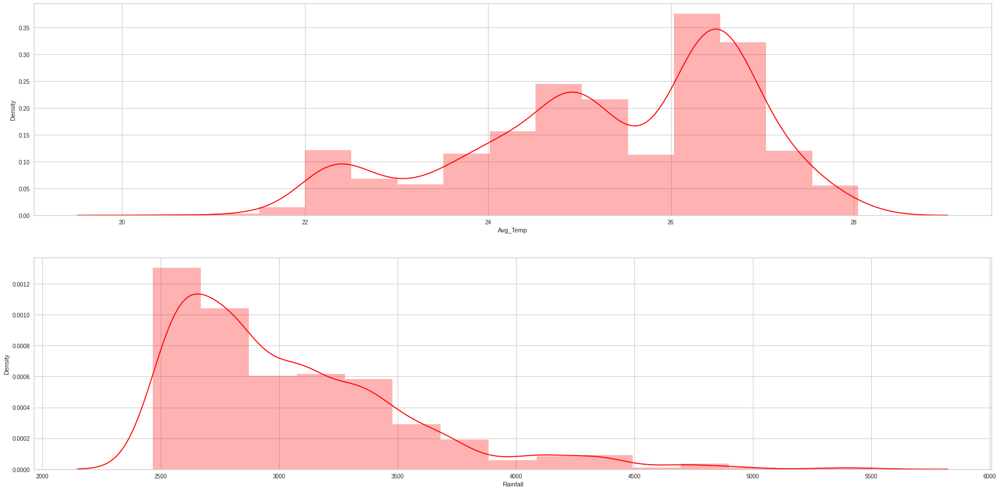

In [98]:
plt.figure(figsize = (30,15))
plt.subplot(2, 1, 1)
sns.distplot(KM_cluster1_df['Avg_Temp'],color="red",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 1, 2)
sns.distplot(KM_cluster1_df['Rainfall'],color="red",bins=15,hist_kws={'alpha':0.3})

In [99]:
cluster_1_temp_median = KM_cluster1_df["Avg_Temp"].median()
print("The median of the Average Temperature for cluster 1 is:\n{}".format(cluster_1_temp_median))

The median of the Average Temperature for cluster 1 is:
25.519166666666663


In [100]:
cluster_1_rain_median = KM_cluster1_df["Rainfall"].median()
print("The median of the Rainfall for cluster 1 is:\n{}".format(cluster_1_rain_median))

The median of the Rainfall for cluster 1 is:
2910.5200000000004


### Analysis on Fertilizer Conditions

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

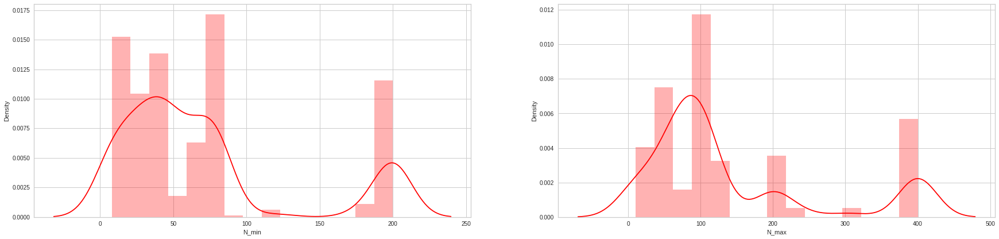

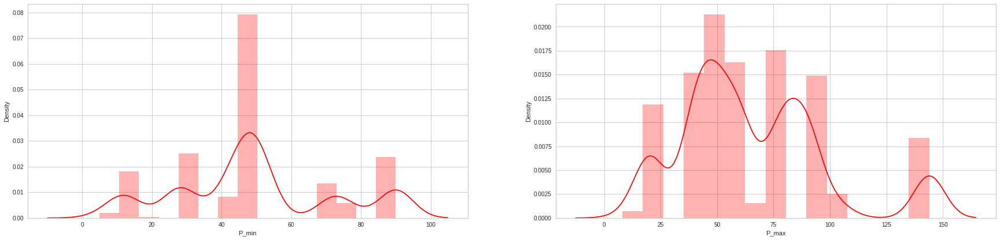

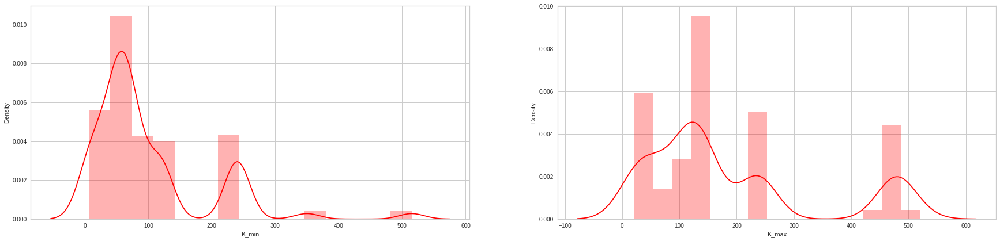

In [101]:
# N_min / N_max
plt.figure(figsize = (30,15))
plt.subplot(2, 2, 1)
sns.distplot(KM_cluster1_df['N_min'],color="red",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 2, 2)
sns.distplot(KM_cluster1_df['N_max'],color="red",bins=15,hist_kws={'alpha':0.3})

# P_min / P_max
plt.figure(figsize = (30,15))
plt.subplot(2, 2, 1)
sns.distplot(KM_cluster1_df['P_min'],color="red",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 2, 2)
sns.distplot(KM_cluster1_df['P_max'],color="red",bins=15,hist_kws={'alpha':0.3})

# K_min / K_max
plt.figure(figsize = (30,15))
plt.subplot(2, 2, 1)
sns.distplot(KM_cluster1_df['K_min'],color="red",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 2, 2)
sns.distplot(KM_cluster1_df['K_max'],color="red",bins=15,hist_kws={'alpha':0.3})

In [102]:
cluster_1_Nmin_median = KM_cluster1_df["N_min"].median()
print("The median of the N_min for cluster 1 is:\n{}".format(cluster_1_Nmin_median))
cluster_1_Nmax_median = KM_cluster1_df["N_max"].median()
print("The median of the N_max for cluster 1 is:\n{}".format(cluster_1_Nmax_median))

The median of the N_min for cluster 1 is:
45.0
The median of the N_max for cluster 1 is:
90.0


In [103]:
cluster_1_Pmin_median = KM_cluster1_df["P_min"].median()
print("The median of the P_min for cluster 1 is:\n{}".format(cluster_1_Pmin_median))
cluster_1_Pmax_median = KM_cluster1_df["P_max"].median()
print("The median of the P_max for cluster 1 is:\n{}".format(cluster_1_Pmax_median))

The median of the P_min for cluster 1 is:
50.0
The median of the P_max for cluster 1 is:
60.0


In [104]:
cluster_1_Kmin_median = KM_cluster1_df["K_min"].median()
print("The median of the K_min for cluster 1 is:\n{}".format(cluster_1_Kmin_median))
cluster_1_Kmax_median = KM_cluster1_df["K_max"].median()
print("The median of the K_max for cluster 1 is:\n{}".format(cluster_1_Kmax_median))

The median of the K_min for cluster 1 is:
60.0
The median of the K_max for cluster 1 is:
140.0


### Presence compare to the total dataset

In [105]:
count_1 = KM_cluster1_df.copy()
count_1 = count_1.drop(columns = ["N_min", "N_max", "P_min", "P_max", "K_min", "K_max", "Avg_Temp", "Rainfall", "Area", "Productivity", "EUR/ha", "EUR/kg", "Production", "Production_kg"])
count_1["Count"] = 1
count_1 = count_1.groupby(["Crop", "KM_Clusters"]).sum().reset_index()
count_1

,Crop,KM_Clusters,Count
0,Arecanut,1,282
1,Banana,1,308
2,Bitter Gourd,1,10
3,Black pepper,1,215
4,Cardamom,1,87
5,Cashewnut,1,158
6,Drum Stick,1,19
7,Dry ginger,1,176
8,Jack Fruit,1,10
9,Niger seed,1,5


In [106]:
count_1_total = pd.merge(count_1, count_original, on = "Crop")
count_1_total["%in1"] = count_1_total["Count"]*100/count_1_total["Total_Count"]
count_1_total

,Crop,KM_Clusters,Count,Total_Count,%in1
0,Arecanut,1,282,830,33.975904
1,Banana,1,308,1773,17.371686
2,Bitter Gourd,1,10,47,21.276596
3,Black pepper,1,215,453,47.461369
4,Cardamom,1,87,194,44.845361
5,Cashewnut,1,158,526,30.038023
6,Drum Stick,1,19,70,27.142857
7,Dry ginger,1,176,831,21.179302
8,Jack Fruit,1,10,48,20.833333
9,Niger seed,1,5,45,11.111111


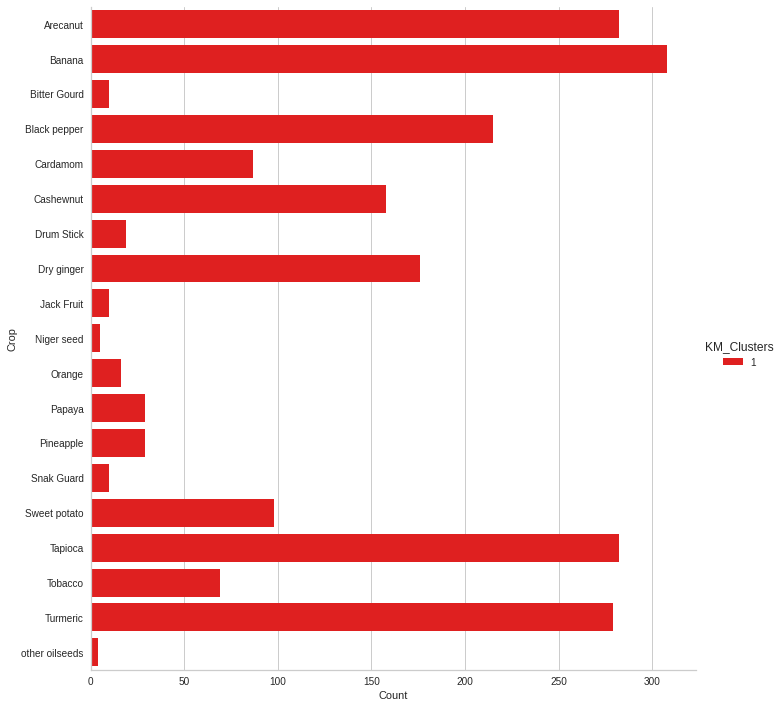

In [107]:
sns.catplot(data = count_1, x = "Count", y = "Crop", hue = "KM_Clusters", kind = "bar", height = 10, palette = palette_red)

## Cluster 2

In [108]:
KM_cluster2_df.describe()

,N_min,N_max,P_min,P_max,K_min,K_max,Avg_Temp,Rainfall,Productivity,EUR/ha,EUR/kg,Area,Production,Production_kg,KM_Clusters
count,12082.000000,12082.000000,12082.000000,12082.000000,12082.000000,12082.000000,12082.000000,12082.000000,1.208200e+04,1.208200e+04,12082.000000,12082.000000,1.208200e+04,1.208200e+04,12082.0
mean,68.085002,168.401341,48.616537,81.492551,66.150058,161.077967,26.492664,655.596535,5.149266e+04,1.277693e+04,1.812049,6137.992385,9.157108e+04,9.157108e+07,2.0
std,53.563128,120.746281,22.068529,45.342475,64.629871,152.119067,1.078928,186.201500,1.706585e+06,3.116495e+05,3.371748,31185.447628,6.261814e+05,6.261814e+08,0.0
min,8.000000,10.000000,5.000000,8.000000,0.000000,20.000000,22.781250,34.240000,0.000000e+00,0.000000e+00,0.182557,1.000000,0.000000e+00,0.000000e+00,2.0
25%,25.000000,60.000000,28.000000,50.000000,30.000000,60.000000,25.840417,548.670000,7.500000e+02,1.035213e+03,0.228196,27.000000,3.800000e+01,3.800000e+04,2.0
50%,60.000000,120.000000,50.000000,75.000000,50.000000,92.000000,26.462708,695.460000,2.647037e+03,2.738348e+03,0.855734,183.000000,5.080000e+02,5.080000e+05,2.0
75%,105.000000,303.000000,60.000000,100.000000,66.000000,220.000000,27.154167,802.500000,1.435064e+04,7.603372e+03,1.745697,1455.000000,9.670250e+03,9.670250e+06,2.0
max,200.000000,400.000000,110.000000,250.000000,515.000000,520.000000,29.852083,953.420000,8.800000e+07,1.606498e+07,17.114676,884618.000000,2.004970e+07,2.004970e+10,2.0


Reletive Plot of All the Features in the KM Cluster 2


<Figure size 576x396 with 0 Axes>

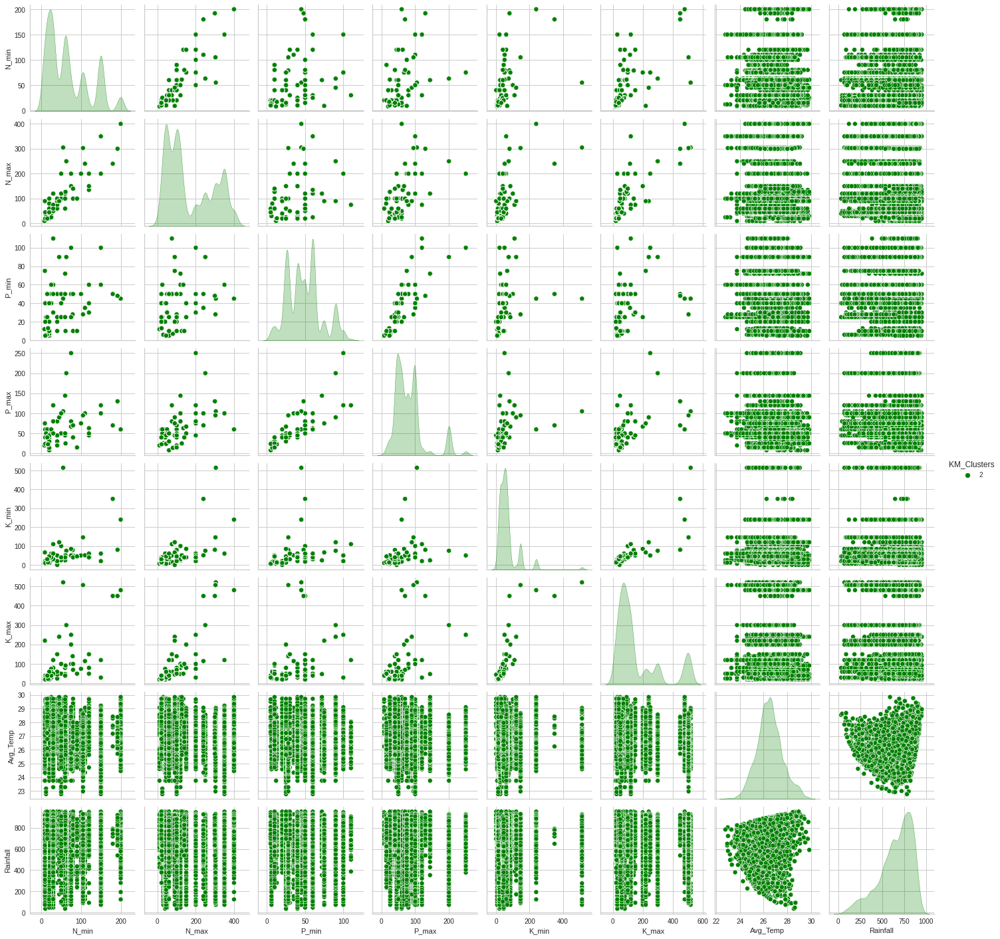

In [109]:
#Plotting features
palette_green = ["green"]
To_Plot = ["N_min",	"N_max",	"P_min",	"P_max",	"K_min",	"K_max",	"Avg_Temp",	"Rainfall", "KM_Clusters"]
print("Reletive Plot of All the Features in the KM Cluster 2")
plt.figure()
sns.pairplot(KM_cluster2_df[To_Plot], hue = "KM_Clusters", palette = palette_green)
plt.show()

### Analysis on Environmental Conditions
Average annual temperature and total annual rainfall 

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


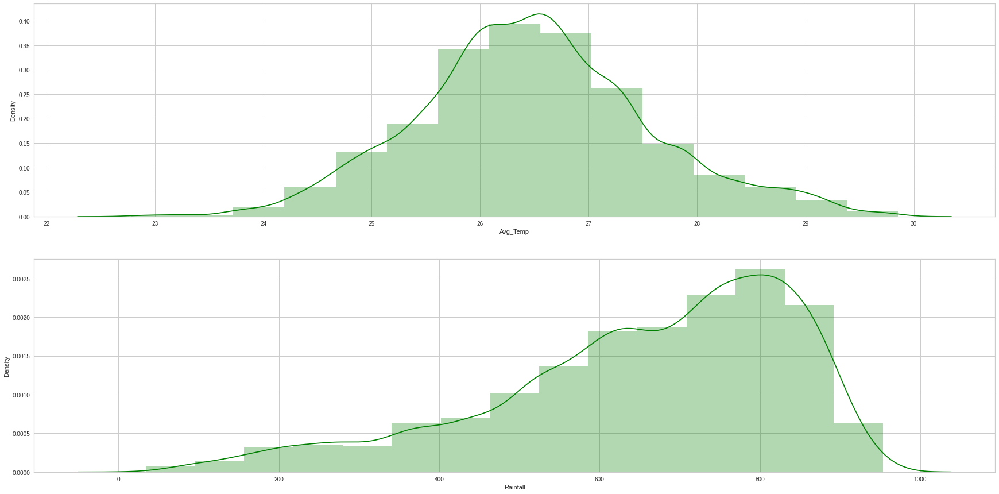

In [110]:
plt.figure(figsize = (30,15))
plt.subplot(2, 1, 1)
sns.distplot(KM_cluster2_df['Avg_Temp'],color="green",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 1, 2)
sns.distplot(KM_cluster2_df['Rainfall'],color="green",bins=15,hist_kws={'alpha':0.3})

In [111]:
cluster_2_temp_median = KM_cluster2_df["Avg_Temp"].median()
print("The median of the Average Temperature for cluster 2 is:\n{}".format(cluster_2_temp_median))

The median of the Average Temperature for cluster 2 is:
26.46270833333333


In [112]:
cluster_2_rain_median = KM_cluster2_df["Rainfall"].median()
print("The median of the Rainfall for cluster 2 is:\n{}".format(cluster_2_rain_median))

The median of the Rainfall for cluster 2 is:
695.46


### Analysis on Fertilizer Conditions

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

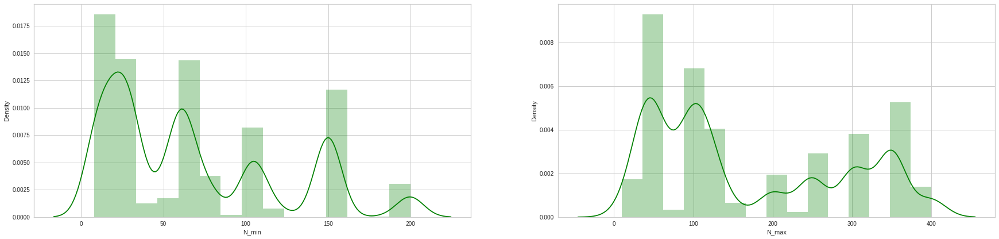

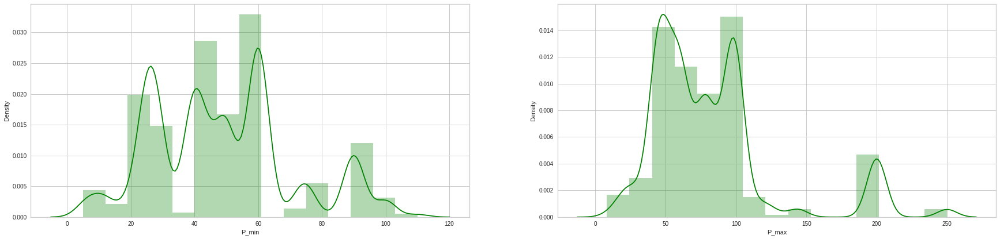

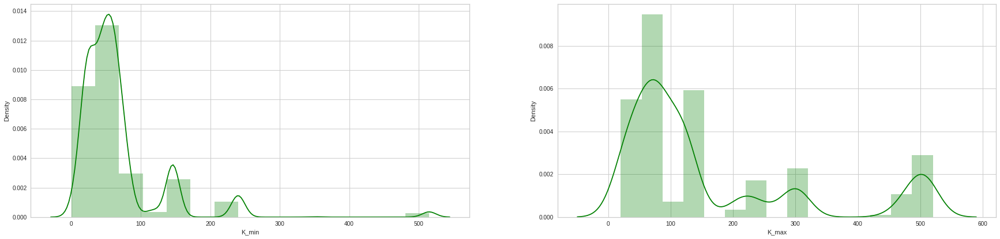

In [113]:
# N_min / N_max
plt.figure(figsize = (30,15))
plt.subplot(2, 2, 1)
sns.distplot(KM_cluster2_df['N_min'],color="green",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 2, 2)
sns.distplot(KM_cluster2_df['N_max'],color="green",bins=15,hist_kws={'alpha':0.3})

# P_min / P_max
plt.figure(figsize = (30,15))
plt.subplot(2, 2, 1)
sns.distplot(KM_cluster2_df['P_min'],color="green",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 2, 2)
sns.distplot(KM_cluster2_df['P_max'],color="green",bins=15,hist_kws={'alpha':0.3})

# K_min / K_max
plt.figure(figsize = (30,15))
plt.subplot(2, 2, 1)
sns.distplot(KM_cluster2_df['K_min'],color="green",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 2, 2)
sns.distplot(KM_cluster2_df['K_max'],color="green",bins=15,hist_kws={'alpha':0.3})

In [114]:
cluster_2_Nmin_median = KM_cluster2_df["N_min"].median()
print("The median of the N_min for cluster 2 is:\n{}".format(cluster_2_Nmin_median))
cluster_2_Nmax_median = KM_cluster2_df["N_max"].median()
print("The median of the N_max for cluster 2 is:\n{}".format(cluster_2_Nmax_median))

The median of the N_min for cluster 2 is:
60.0
The median of the N_max for cluster 2 is:
120.0


In [115]:
cluster_2_Pmin_median = KM_cluster2_df["P_min"].median()
print("The median of the P_min for cluster 2 is:\n{}".format(cluster_2_Pmin_median))
cluster_2_Pmax_median = KM_cluster2_df["P_max"].median()
print("The median of the P_max for cluster 2 is:\n{}".format(cluster_2_Pmax_median))

The median of the P_min for cluster 2 is:
50.0
The median of the P_max for cluster 2 is:
75.0


In [116]:
cluster_2_Kmin_median = KM_cluster2_df["K_min"].median()
print("The median of the K_min for cluster 2 is:\n{}".format(cluster_2_Kmin_median))
cluster_2_Kmax_median = KM_cluster2_df["K_max"].median()
print("The median of the K_max for cluster 2 is:\n{}".format(cluster_2_Kmax_median))

The median of the K_min for cluster 2 is:
50.0
The median of the K_max for cluster 2 is:
92.0


### Presence compare to the total dataset

In [117]:
count_2 = KM_cluster2_df.copy()
count_2 = count_2.drop(columns = ["N_min", "N_max", "P_min", "P_max", "K_min", "K_max", "Avg_Temp", "Rainfall", "Area", "Productivity", "EUR/ha", "EUR/kg", "Production", "Production_kg"])
count_2["Count"] = 1
count_2 = count_2.groupby(["Crop", "KM_Clusters"]).sum().reset_index()
count_2

,Crop,KM_Clusters,Count
0,Arecanut,2,132
1,Arhar/Tur,2,56
2,Bajra,2,36
3,Banana,2,435
4,Beans & Mutter(Vegetable),2,57
5,Bhindi,2,71
6,Bitter Gourd,2,14
7,Black pepper,2,49
8,Brinjal,2,98
9,Cabbage,2,53


In [132]:
count_2_total = pd.merge(count_2, count_original, on = "Crop")
count_2_total["%in2"] = count_2_total["Count"]*100/count_2_total["Total_Count"]
count_2_total

,Crop,KM_Clusters,Count,Total_Count,%in2
0,Arecanut,2,132,830,15.903614
1,Arhar/Tur,2,56,141,39.716312
2,Bajra,2,36,86,41.860465
3,Banana,2,435,1773,24.534687
4,Beans & Mutter(Vegetable),2,57,84,67.857143
5,Bhindi,2,71,128,55.468750
6,Bitter Gourd,2,14,47,29.787234
7,Black pepper,2,49,453,10.816777
8,Brinjal,2,98,157,62.420382
9,Cabbage,2,53,87,60.919540


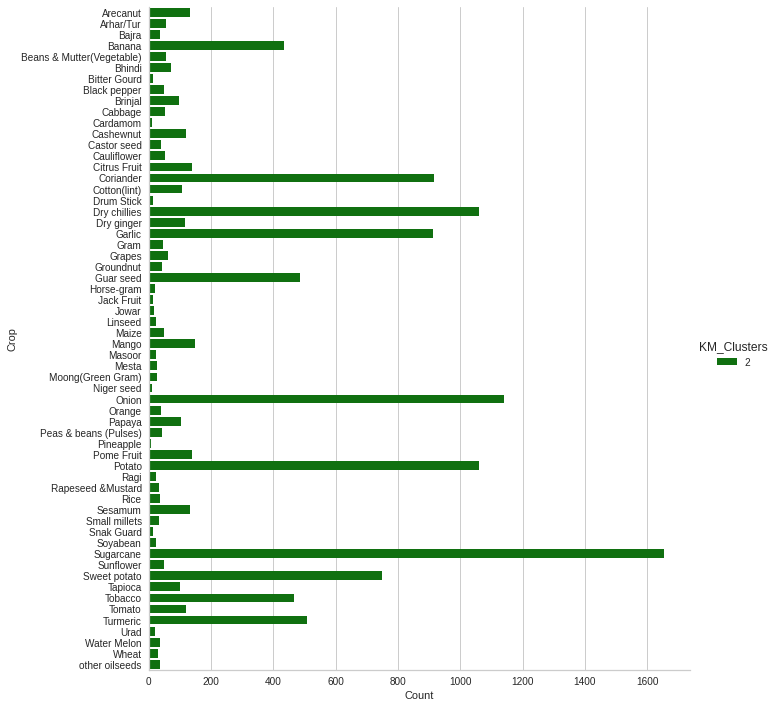

In [119]:
sns.catplot(data = count_2, x = "Count", y = "Crop", hue = "KM_Clusters", kind = "bar", height = 10, palette = palette_green)

## Cluster 3

In [120]:
KM_cluster3_df.describe()

,N_min,N_max,P_min,P_max,K_min,K_max,Avg_Temp,Rainfall,Productivity,EUR/ha,EUR/kg,Area,Production,Production_kg,KM_Clusters
count,12442.000000,12442.000000,12442.000000,12442.000000,12442.000000,12442.000000,12442.000000,12442.000000,1.244200e+04,1.244200e+04,12442.000000,12442.000000,1.244200e+04,1.244200e+04,12442.0
mean,68.919145,167.134303,47.749076,77.922601,68.177946,163.449365,26.113467,1141.299195,3.104555e+04,8.699549e+03,1.354278,3917.387295,1.246462e+05,1.246462e+08,3.0
std,55.324910,124.247113,21.226500,42.734041,60.812323,153.522272,1.157460,165.547511,1.104300e+06,2.016804e+05,1.752064,16297.657309,9.112366e+05,9.112366e+08,0.0
min,8.000000,10.000000,5.000000,8.000000,0.000000,20.000000,22.330833,806.770000,0.000000e+00,0.000000e+00,0.182557,1.000000,0.000000e+00,0.000000e+00,3.0
25%,25.000000,60.000000,28.000000,50.000000,30.000000,60.000000,25.430417,1008.830000,7.955909e+02,1.170542e+03,0.228196,39.000000,5.900000e+01,5.900000e+04,3.0
50%,60.000000,120.000000,45.000000,67.000000,60.000000,120.000000,26.000833,1113.110000,3.000000e+03,2.556371e+03,0.855734,238.000000,6.305000e+02,6.305000e+05,3.0
75%,105.000000,303.000000,60.000000,95.000000,66.000000,220.000000,26.737083,1262.290000,1.408968e+04,6.247656e+03,1.745697,1372.000000,8.947500e+03,8.947500e+06,3.0
max,200.000000,400.000000,110.000000,250.000000,515.000000,520.000000,29.438750,1612.160000,7.450000e+07,1.360046e+07,17.114676,340534.000000,3.715800e+07,3.715800e+10,3.0


Reletive Plot of All the Features in the KM Cluster 3


<Figure size 576x396 with 0 Axes>

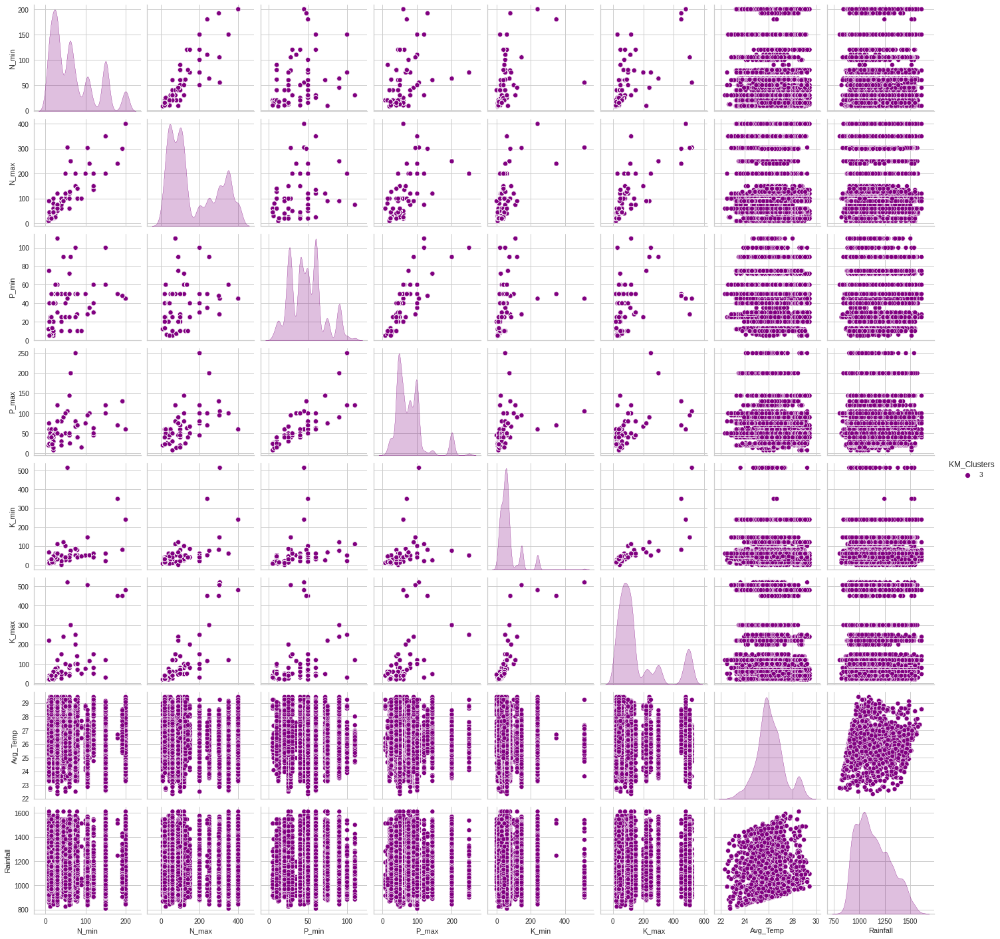

In [121]:
#Plotting features
palette_purple = ["purple"]
To_Plot = ["N_min",	"N_max",	"P_min",	"P_max",	"K_min",	"K_max",	"Avg_Temp",	"Rainfall", "KM_Clusters"]
print("Reletive Plot of All the Features in the KM Cluster 3")
plt.figure()
sns.pairplot(KM_cluster3_df[To_Plot], hue = "KM_Clusters", palette = palette_purple)
plt.show()

### Analysis on Environmental Conditions
Average annual temperature and total annual rainfall 

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


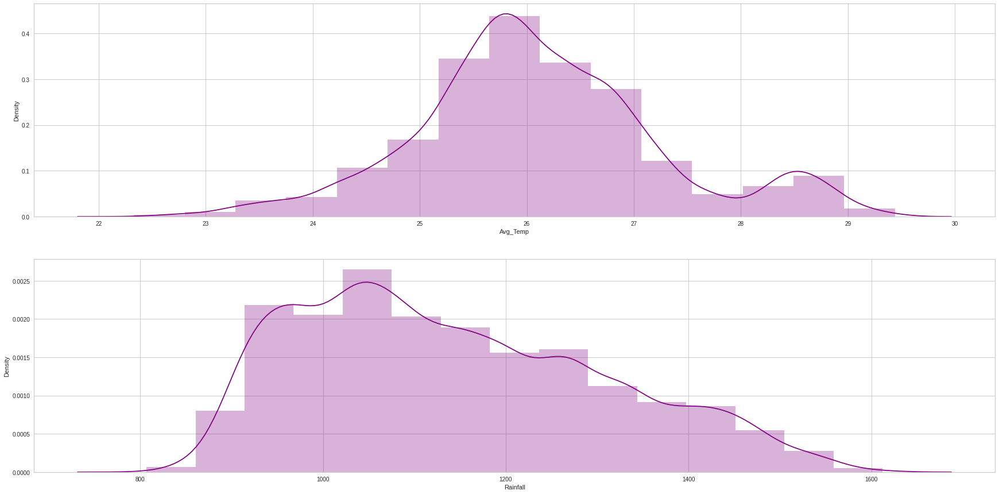

In [122]:
plt.figure(figsize = (30,15))
plt.subplot(2, 1, 1)
sns.distplot(KM_cluster3_df['Avg_Temp'],color="purple",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 1, 2)
sns.distplot(KM_cluster3_df['Rainfall'],color="purple",bins=15,hist_kws={'alpha':0.3})

In [123]:
cluster_3_temp_median = KM_cluster3_df["Avg_Temp"].median()
print("The median of the Average Temperature for cluster 3 is:\n{}".format(cluster_3_temp_median))

The median of the Average Temperature for cluster 3 is:
26.000833333333333


In [124]:
cluster_3_rain_median = KM_cluster3_df["Rainfall"].median()
print("The median of the Rainfall for cluster 3 is:\n{}".format(cluster_3_rain_median))

The median of the Rainfall for cluster 3 is:
1113.11


### Analysis on Fertilizer Conditions

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

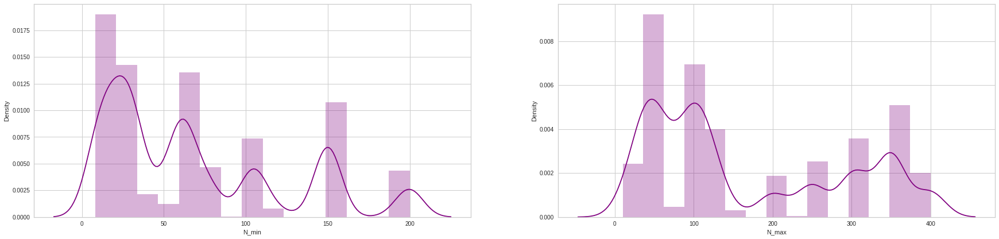

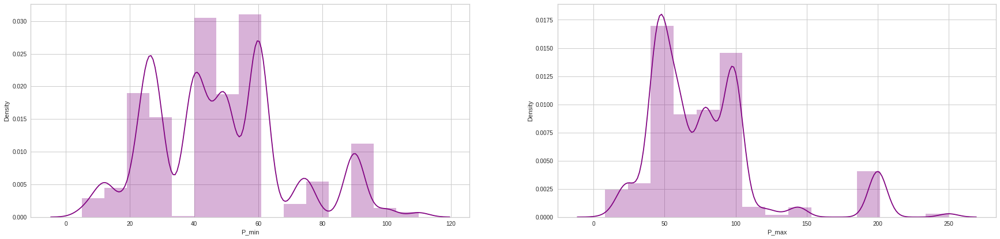

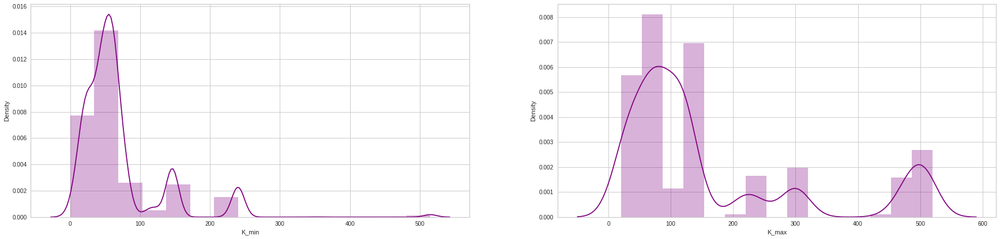

In [125]:
# N_min / N_max
plt.figure(figsize = (30,15))
plt.subplot(2, 2, 1)
sns.distplot(KM_cluster3_df['N_min'],color="purple",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 2, 2)
sns.distplot(KM_cluster3_df['N_max'],color="purple",bins=15,hist_kws={'alpha':0.3})

# P_min / P_max
plt.figure(figsize = (30,15))
plt.subplot(2, 2, 1)
sns.distplot(KM_cluster3_df['P_min'],color="purple",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 2, 2)
sns.distplot(KM_cluster3_df['P_max'],color="purple",bins=15,hist_kws={'alpha':0.3})

# K_min / K_max
plt.figure(figsize = (30,15))
plt.subplot(2, 2, 1)
sns.distplot(KM_cluster3_df['K_min'],color="purple",bins=15,hist_kws={'alpha':0.3})

plt.subplot(2, 2, 2)
sns.distplot(KM_cluster3_df['K_max'],color="purple",bins=15,hist_kws={'alpha':0.3})

In [126]:
cluster_3_Nmin_median = KM_cluster3_df["N_min"].median()
print("The median of the N_min for cluster 3 is:\n{}".format(cluster_3_Nmin_median))
cluster_3_Nmax_median = KM_cluster3_df["N_max"].median()
print("The median of the N_max for cluster 3 is:\n{}".format(cluster_3_Nmax_median))

The median of the N_min for cluster 3 is:
60.0
The median of the N_max for cluster 3 is:
120.0


In [127]:
cluster_3_Pmin_median = KM_cluster3_df["P_min"].median()
print("The median of the P_min for cluster 3 is:\n{}".format(cluster_3_Pmin_median))
cluster_3_Pmax_median = KM_cluster3_df["P_max"].median()
print("The median of the P_max for cluster 3 is:\n{}".format(cluster_3_Pmax_median))

The median of the P_min for cluster 3 is:
45.0
The median of the P_max for cluster 3 is:
67.0


In [128]:
cluster_3_Kmin_median = KM_cluster3_df["K_min"].median()
print("The median of the K_min for cluster 3 is:\n{}".format(cluster_3_Kmin_median))
cluster_3_Kmax_median = KM_cluster3_df["K_max"].median()
print("The median of the K_max for cluster 3 is:\n{}".format(cluster_3_Kmax_median))

The median of the K_min for cluster 3 is:
60.0
The median of the K_max for cluster 3 is:
120.0


### Presence compare to the total dataset

In [133]:
count_3 = KM_cluster3_df.copy()
count_3 = count_3.drop(columns = ["N_min", "N_max", "P_min", "P_max", "K_min", "K_max", "Avg_Temp", "Rainfall", "Area", "Productivity", "EUR/ha", "EUR/kg", "Production", "Production_kg"])
count_3["Count"] = 1
count_3 = count_3.groupby(["Crop", "KM_Clusters"]).sum().reset_index()
count_3

,Crop,KM_Clusters,Count
0,Arecanut,3,182
1,Arhar/Tur,3,84
2,Bajra,3,49
3,Banana,3,653
4,Beans & Mutter(Vegetable),3,27
5,Bhindi,3,52
6,Bitter Gourd,3,11
7,Black pepper,3,79
8,Brinjal,3,54
9,Cabbage,3,34


In [135]:
count_3_total = pd.merge(count_3, count_original, on = "Crop")
count_3_total["%in3"] = count_3_total["Count"]*100/count_3_total["Total_Count"]
count_3_total

,Crop,KM_Clusters,Count,Total_Count,%in3
0,Arecanut,3,182,830,21.927711
1,Arhar/Tur,3,84,141,59.574468
2,Bajra,3,49,86,56.976744
3,Banana,3,653,1773,36.830231
4,Beans & Mutter(Vegetable),3,27,84,32.142857
5,Bhindi,3,52,128,40.625000
6,Bitter Gourd,3,11,47,23.404255
7,Black pepper,3,79,453,17.439294
8,Brinjal,3,54,157,34.394904
9,Cabbage,3,34,87,39.080460


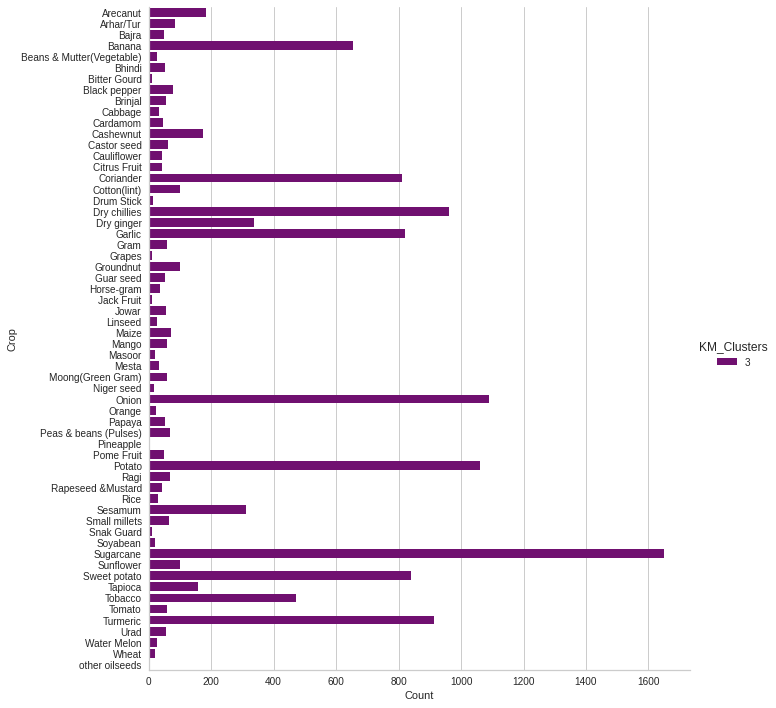

In [131]:
sns.catplot(data = count_3, x = "Count", y = "Crop", hue = "KM_Clusters", kind = "bar", height = 10, palette = palette_purple)